In [1]:
from scipy.ndimage import gaussian_filter
from scipy import stats
from scipy.ndimage import gaussian_filter1d

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns


In [3]:
import traja
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy import stats
from scipy.fft import rfft, rfftfreq
%matplotlib inline

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
def openFile(ff):
    df = pd.read_csv(ff, sep=" ",header = None, names=['numb', 'time', 'x', 'y'])
    df = df.drop('numb', axis=1)
    df = df.drop(df[df.time > 1755].index)
    df = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]
    df.traja.plot()
    return(df)

#### вставляю функции фиттера прямо в код, т к не выходит пользоваться пэкеджем

In [5]:
#  This file is part of the fitter software
#
#  Copyright (c) 2014-2022
#
#  File author(s): Thomas Cokelaer <cokelaer@gmail.com>
#
#  Distributed under the GPLv3 License.
#  See accompanying file LICENSE.txt or copy at
#      http://www.gnu.org/licenses/gpl-3.0.html
#
#  source: https://github.com/cokelaer/fitter
#  Documentation: http://packages.python.org/fitter
#  Package: http://pypi.python.org/fitter
#
##############################################################################
"""main module of the fitter package

.. sectionauthor:: Thomas Cokelaer, Aug 2014-2020

"""
import sys
import contextlib
import threading
from datetime import datetime

import logging

import numpy as np
import pandas as pd
import pylab
import scipy.stats

import joblib
from joblib.parallel import Parallel, delayed
from tqdm import tqdm
from scipy.stats import entropy as kl_div, kstest

logger = logging.getLogger(__name__)

__all__ = ["get_common_distributions", "get_distributions", "Fitter"]



# A solution to wrap joblib parallel call in tqdm from 
# https://stackoverflow.com/questions/24983493/tracking-progress-of-joblib-parallel-execution/58936697#58936697
# and https://github.com/louisabraham/tqdm_joblib
@contextlib.contextmanager
def tqdm_joblib(*args, **kwargs):
    """Context manager to patch joblib to report into tqdm progress bar
    given as argument"""

    tqdm_object = tqdm(*args, **kwargs)

    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)

        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)

    old_batch_callback = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_batch_callback
        tqdm_object.close()








def get_distributions():
    distributions = []
    for this in dir(scipy.stats):
        if "fit" in eval("dir(scipy.stats." + this + ")"):
            distributions.append(this)
    return distributions


def get_common_distributions():
    distributions = get_distributions()
    # to avoid error due to changes in scipy
    common = [
        "cauchy",
        "chi2",
        "expon",
        "exponpow",
        "gamma",
        "lognorm",
        "norm",
        "powerlaw",
        "rayleigh",
        "uniform",
    ]
    common = [x for x in common if x in distributions]
    return common


class Fitter(object):
    """Fit a data sample to known distributions

    A naive approach often performed to figure out the undelying distribution that
    could have generated a data set, is to compare the histogram of the data with
    a PDF (probability distribution function) of a known distribution (e.g., normal).

    Yet, the parameters of the distribution are not known and there are lots of
    distributions. Therefore, an automatic way to fit many distributions to the data
    would be useful, which is what is implemented here.

    Given a data sample, we use the `fit` method of SciPy to extract the parameters
    of that distribution that best fit the data. We repeat this for all available distributions.
    Finally, we provide a summary so that one can see the quality of the fit for those distributions

    Here is an example where we generate a sample from a gamma distribution.

    ::

        >>> # First, we create a data sample following a Gamma distribution
        >>> from scipy import stats
        >>> data = stats.gamma.rvs(2, loc=1.5, scale=2, size=20000)

        >>> # We then create the Fitter object
        >>> import fitter
        >>> f = fitter.Fitter(data)

        >>> # just a trick to use only 10 distributions instead of 80 to speed up the fitting
        >>> f.distributions = f.distributions[0:10] + ['gamma']

        >>> # fit and plot
        >>> f.fit()
        >>> f.summary()
                sumsquare_error
        gamma          0.000095
        beta           0.000179
        chi            0.012247
        cauchy         0.044443
        anglit         0.051672
        [5 rows x 1 columns]

    Once the data has been fitted, the :meth:`summary` metod returns a sorted dataframe where the

    Looping over the 80 distributions in SciPy could takes some times so you can overwrite the
    :attr:`distributions` with a subset if you want. In order to reload all distributions,
    call :meth:`load_all_distributions`.

    Some distributions do not converge when fitting. There is a timeout of 30 seconds after which
    the fitting procedure is cancelled. You can change this :attr:`timeout` attribute if needed.

    If the histogram of the data has outlier of very long tails, you may want to increase the
    :attr:`bins` binning or to ignore data below or above a certain range. This can be achieved
    by setting the :attr:`xmin` and :attr:`xmax` attributes. If you set xmin, you can come back to
    the original data by setting xmin to None (same for xmax) or just recreate an instance.
    """

    def __init__(
        self,
        data,
        xmin=None,
        xmax=None,
        bins=100,
        distributions=None,
        timeout=30,
        density=True,
    ):
        """.. rubric:: Constructor

        :param list data: a numpy array or a list
        :param float xmin: if None, use the data minimum value, otherwise histogram and
            fits will be cut
        :param float xmax: if None, use the data maximum value, otherwise histogram and
            fits will be cut
        :param int bins: numbers of bins to be used for the cumulative histogram. This has
            an impact on the quality of the fit.
        :param list distributions: give a list of distributions to look at. If none, use
            all scipy distributions that have a fit method. If you want to use
            only one distribution and know its name, you may provide a string (e.g.
            'gamma'). Finally, you may set to 'common' to  include only common
            distributions, which are: cauchy, chi2, expon, exponpow, gamma,
                 lognorm, norm, powerlaw, irayleigh, uniform.
        :param timeout: max time for a given distribution. If timeout is
            reached, the distribution is skipped.

        .. versionchanged:: 1.2.1 remove verbose argument, replacedb by logging module.
        .. versionchanged:: 1.0.8 increase timeout from 10 to 30 seconds.
        """
        self.timeout = timeout
        # USER input
        self._data = None

        # Issue https://github.com/cokelaer/fitter/issues/22 asked for setting
        # the density to False in the fitting and plotting. I first tought it
        # would be possible, but the fitting is performed using the PDF of scipy
        # so one would still need to normalise the data so that it is
        # comparable. Therefore I do not see anyway to do it without using
        # density set to True for now.
        self._density = True

        #: list of distributions to test
        self.distributions = distributions
        if self.distributions == None:
            self._load_all_distributions()
        elif self.distributions == "common":
            self.distributions = get_common_distributions()
        elif isinstance(distributions, str):
            self.distributions = [distributions]

        self.bins = bins

        self._alldata = np.array(data)
        if xmin == None:
            self._xmin = self._alldata.min()
        else:
            self._xmin = xmin
        if xmax == None:
            self._xmax = self._alldata.max()
        else:
            self._xmax = xmax

        self._trim_data()
        self._update_data_pdf()

        # Other attributes
        self._init()

    def _init(self):
        self.fitted_param = {}
        self.fitted_pdf = {}
        self._fitted_errors = {}
        self._aic = {}
        self._bic = {}
        self._kldiv = {}
        self._ks_stat = {}
        self._ks_pval = {}
        self._fit_i = 0  # fit progress
        #self.pb = None

    def _update_data_pdf(self):
        # histogram retuns X with N+1 values. So, we rearrange the X output into only N
        self.y, self.x = np.histogram(self._data, bins=self.bins, density=self._density)
        self.x = [(this + self.x[i + 1]) / 2.0 for i, this in enumerate(self.x[0:-1])]

    def _trim_data(self):
        self._data = self._alldata[np.logical_and(self._alldata >= self._xmin, self._alldata <= self._xmax)]

    def _get_xmin(self):
        return self._xmin

    def _set_xmin(self, value):
        if value == None:
            value = self._alldata.min()
        elif value < self._alldata.min():
            value = self._alldata.min()
        self._xmin = value
        self._trim_data()
        self._update_data_pdf()

    xmin = property(_get_xmin, _set_xmin, doc="consider only data above xmin. reset if None")

    def _get_xmax(self):
        return self._xmax

    def _set_xmax(self, value):
        if value == None:
            value = self._alldata.max()
        elif value > self._alldata.max():
            value = self._alldata.max()
        self._xmax = value
        self._trim_data()
        self._update_data_pdf()

    xmax = property(_get_xmax, _set_xmax, doc="consider only data below xmax. reset if None ")

    def _load_all_distributions(self):
        """Replace the :attr:`distributions` attribute with all scipy distributions"""
        self.distributions = get_distributions()

    def hist(self):
        """Draw normed histogram of the data using :attr:`bins`


        .. plot::

            >>> from scipy import stats
            >>> data = stats.gamma.rvs(2, loc=1.5, scale=2, size=20000)
            >>> # We then create the Fitter object
            >>> import fitter
            >>> fitter.Fitter(data).hist()

        """
        _ = pylab.hist(self._data, bins=self.bins, density=self._density)
        pylab.grid(True)


    def _fit_single_distribution(self, distribution):
        try:
            # need a subprocess to check time it takes. If too long, skip it
            dist = eval("scipy.stats." + distribution)

            # TODO here, dist.fit may take a while or just hang forever
            # with some distributions. So, I thought to use signal module
            # to catch the error when signal takes too long. It did not work
            # presumably because another try/exception is inside the
            # fit function, so I used threading with a recipe from stackoverflow
            # See timed_run function above
            param = self._timed_run(dist.fit, distribution, args=self._data)

            # with signal, does not work. maybe because another expection is caught
            # hoping the order returned by fit is the same as in pdf
            pdf_fitted = dist.pdf(self.x, *param)

            self.fitted_param[distribution] = param[:]
            self.fitted_pdf[distribution] = pdf_fitted

            # calculate error
            sq_error = pylab.sum((self.fitted_pdf[distribution] - self.y) ** 2)

            # calculate information criteria
            logLik = np.sum(dist.logpdf(self.x, *param))
            k = len(param[:])
            n = len(self._data)
            aic = 2 * k - 2 * logLik
            bic = n * np.log(sq_error / n) + k * np.log(n)

            # calculate kullback leibler divergence
            kullback_leibler = kl_div(self.fitted_pdf[distribution], self.y)

            # calculate goodness-of-fit statistic
            dist_fitted = dist(*param)
            ks_stat, ks_pval = kstest(self._data, dist_fitted.cdf)

            logger.info("Fitted {} distribution with error={})".format(distribution, sq_error))

            # compute some errors now
            self._fitted_errors[distribution] = sq_error
            self._aic[distribution] = aic
            self._bic[distribution] = bic
            self._kldiv[distribution] = kullback_leibler
            self._ks_stat[distribution] = ks_stat
            self._ks_pval[distribution] = ks_pval
        except Exception:  # pragma: no cover
            logger.warning("SKIPPED {} distribution (taking more than {} seconds)".format(distribution, self.timeout))
            # if we cannot compute the error, set it to large values
            self._fitted_errors[distribution] = np.inf
            self._aic[distribution] = np.inf
            self._bic[distribution] = np.inf
            self._kldiv[distribution] = np.inf

    def fit(self, progress=False, n_jobs=-1, max_workers=-1):
        r"""Loop over distributions and find best parameter to fit the data for each

        When a distribution is fitted onto the data, we populate a set of
        dataframes:

            - :attr:`df_errors`  :sum of the square errors between the data and the fitted
              distribution i.e., :math:`\sum_i \left( Y_i - pdf(X_i) \right)^2`
            - :attr:`fitted_param` : the parameters that best fit the data
            - :attr:`fitted_pdf` : the PDF generated with the parameters that best fit the data

        Indices of the dataframes contains the name of the distribution.

        """
        import warnings

        warnings.filterwarnings("ignore", category=RuntimeWarning)

        N = len(self.distributions)
        with tqdm_joblib(desc=f"Fitting {N} distributions", total=N) as progress_bar:
            Parallel(n_jobs=max_workers, backend='threading')(delayed(self._fit_single_distribution)(dist) for dist in self.distributions)


        self.df_errors = pd.DataFrame(
            {
                "sumsquare_error": self._fitted_errors,
                "aic": self._aic,
                "bic": self._bic,
                "kl_div": self._kldiv,
                "ks_statistic": self._ks_stat,
                "ks_pvalue": self._ks_pval,
            }
        )


    def plot_pdf(self, names=None, Nbest=5, lw=2, method="sumsquare_error"):
        """Plots Probability density functions of the distributions

        :param str,list names: names can be a single distribution name, or a list
            of distribution names, or kept as None, in which case, the first Nbest
            distribution will be taken (default to best 5)


        """
        assert Nbest > 0
        if Nbest > len(self.distributions):
            Nbest = len(self.distributions)

        if isinstance(names, list):
            for name in names:
                pylab.plot(self.x, self.fitted_pdf[name], lw=lw, label=name)
        elif names:
            pylab.plot(self.x, self.fitted_pdf[names], lw=lw, label=names)
        else:
            try:
                names = self.df_errors.sort_values(by=method).index[0:Nbest]
            except Exception:
                names = self.df_errors.sort(method).index[0:Nbest]

            for name in names:
                if name in self.fitted_pdf.keys():
                    pylab.plot(self.x, self.fitted_pdf[name], lw=lw, label=name)
                else:  # pragma: no cover
                    logger.warning("%s was not fitted. no parameters available" % name)
        pylab.grid(True)
        pylab.legend()


    def get_best(self, method="sumsquare_error"):
        """Return best fitted distribution and its parameters

        a dictionary with one key (the distribution name) and its parameters

        """
        # self.df should be sorted, so then us take the first one as the best
        name = self.df_errors.sort_values(method).iloc[0].name
        params = self.fitted_param[name]
        distribution = getattr(scipy.stats, name)
        param_names = (distribution.shapes + ", loc, scale").split(", ") if distribution.shapes else ["loc", "scale"]

        param_dict = {}
        for d_key, d_val in zip(param_names, params):
            param_dict[d_key] = d_val
        return {name: param_dict}


    def summary(self, Nbest=5, lw=2, plot=True, method="sumsquare_error", clf=True):
        """Plots the distribution of the data and Nbest distribution"""
        if plot:
            if clf:
                pylab.clf()
            self.hist()
            self.plot_pdf(Nbest=Nbest, lw=lw, method=method)
            pylab.grid(True)

        Nbest = min(Nbest, len(self.distributions))
        try:
            names = self.df_errors.sort_values(by=method).index[0:Nbest]
        except:  # pragma: no cover
            names = self.df_errors.sort(method).index[0:Nbest]
        return self.df_errors.loc[names]


    def _timed_run(self, func, distribution, args=(), kwargs={}, default=None):
        """This function will spawn a thread and run the given function
        using the args, kwargs and return the given default value if the
        timeout is exceeded.

        http://stackoverflow.com/questions/492519/timeout-on-a-python-function-call
        """

        class InterruptableThread(threading.Thread):
            def __init__(self):
                threading.Thread.__init__(self)
                self.result = default
                self.exc_info = (None, None, None)

            def run(self):
                try:
                    self.result = func(args, **kwargs)
                except Exception as err:  # pragma: no cover
                    self.exc_info = sys.exc_info()

            def suicide(self):  # pragma: no cover
                raise RuntimeError("Stop has been called")

        it = InterruptableThread()
        it.start()
        started_at = datetime.now()
        it.join(self.timeout)
        ended_at = datetime.now()
        diff = ended_at - started_at

        if it.exc_info[0] is not None:  # pragma: no cover ;  if there were any exceptions
            a, b, c = it.exc_info
            raise Exception(a, b, c)  # communicate that to caller

        if it.is_alive():  # pragma: no cover
            it.suicide()
            raise RuntimeError
        else:
            return it.result





### тест не наших данных

In [5]:
dataset = pd.read_csv("weight-height.csv")
dataset.head()

,Gender,Height,Weight
0,Male,73.847017,241.893563
1,Male,68.781904,162.310473
2,Male,74.110105,212.740856
3,Male,71.730978,220.042470
4,Male,69.881796,206.349801


In [14]:
height = dataset["Height"].values

Fitting 5 distributions: 100%|███████████████████████████████████████████████████████████| 5/5 [00:01<00:00,  2.59it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
beta,0.003108,848.384299,-149805.573382,inf,0.013858,4.254279e-02
lognorm,0.005284,803.863780,-144506.315623,inf,0.022787,6.081080e-05
gamma,0.005296,803.860095,-144484.269318,inf,0.023553,2.987814e-05
norm,0.005383,802.162043,-144330.934485,inf,0.025554,4.177451e-06
burr,0.014954,873.340116,-134094.334300,inf,0.063097,4.698479e-35


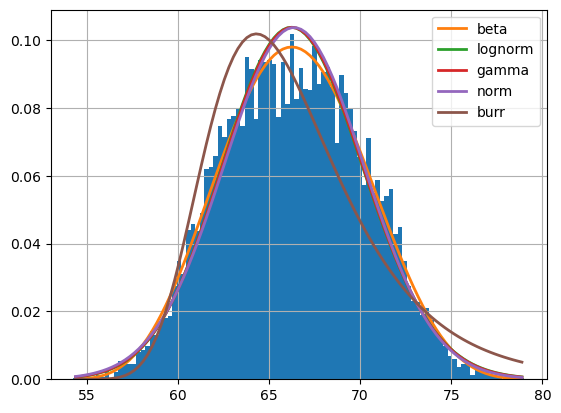

In [15]:
f = Fitter(height,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

### проверим фитится ли логарифм распределения прямой

In [5]:
from sklearn.linear_model import LinearRegression

In [6]:
def build3ShistLog(df,n):
    sampRate = len(df) / (df.iloc[-1]['time'] - df.iloc[0]['time'])
    step = round(sampRate * n)
    #chose which samples will remain
    k = []
    if step == 0:
        step = 1
    for i in range(len(df)):
        if i % step == 0:
            k.append(i)
    df = df.iloc[k]
    
    xy = []
    x0 = df['x'][0]
    y0 = df['y'][0]
    #delX = []
    #delY = []
    for i in range(len(df)):
        dx = df.iloc[i]['x'] - x0
        dy = df.iloc[i]['y'] - y0
        xxy = pow(pow(dx, 2) + pow(dy, 2), 0.5)
        #delX.append(dx)
        #delY.append(dy)
        xy.append(xxy)
        x0 = df.iloc[i]['x']
        y0 = df.iloc[i]['y']

    df.insert(3, "xy", xy)

    xynum = df['xy'].to_numpy()
    #histogram
    plt.figure()
    plt.yscale("log")
    kk = plt.hist(xynum, bins=100)
    plt.show()
    return kk
    

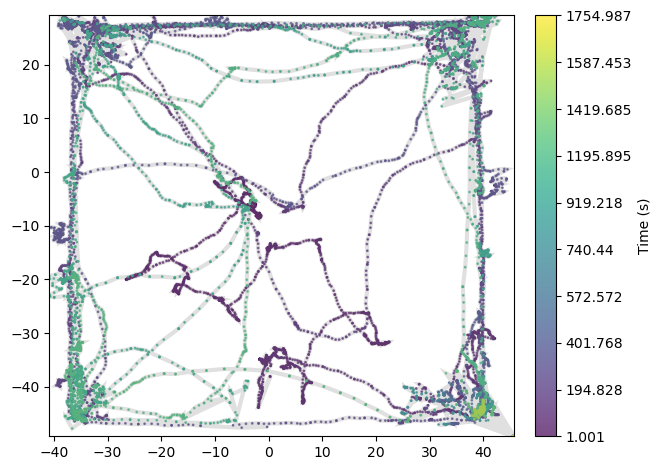

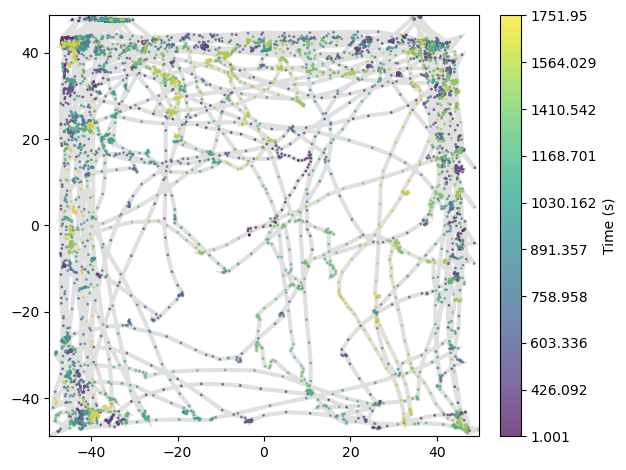

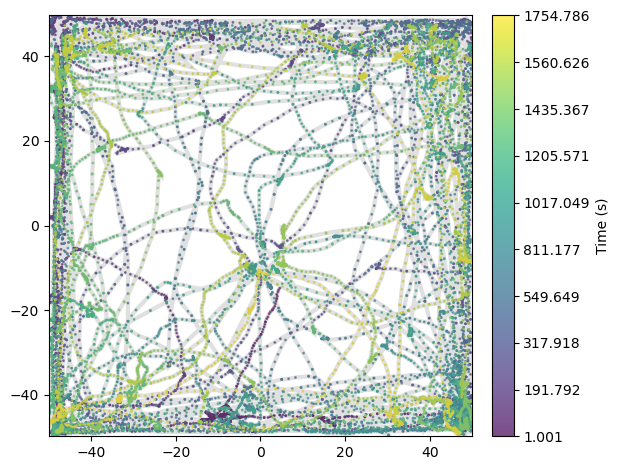

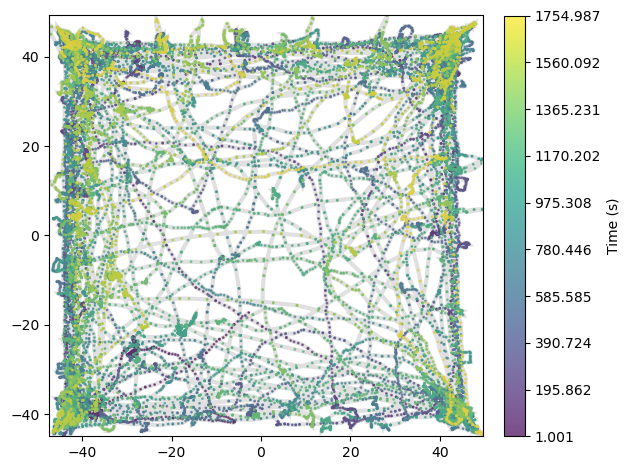

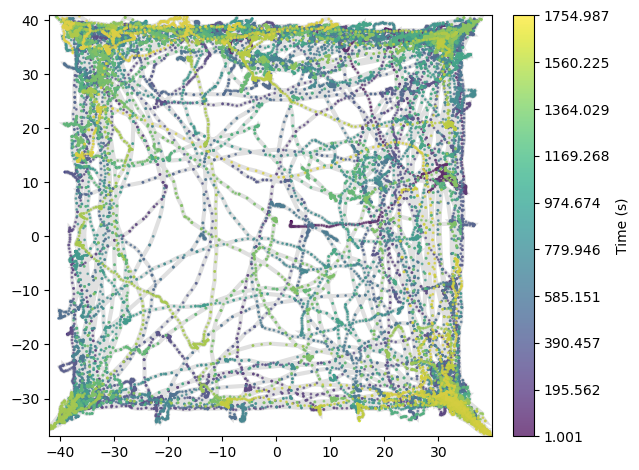

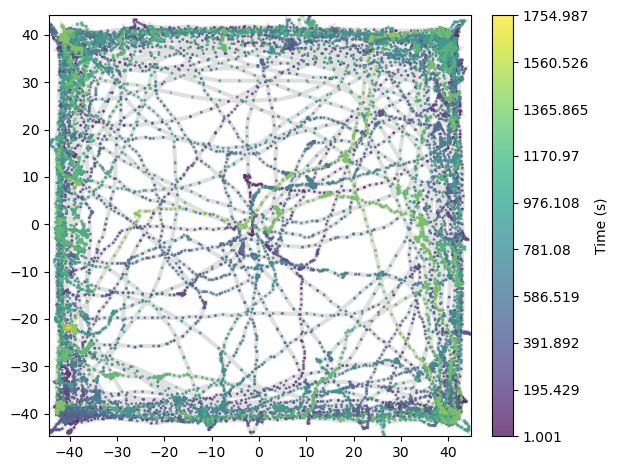

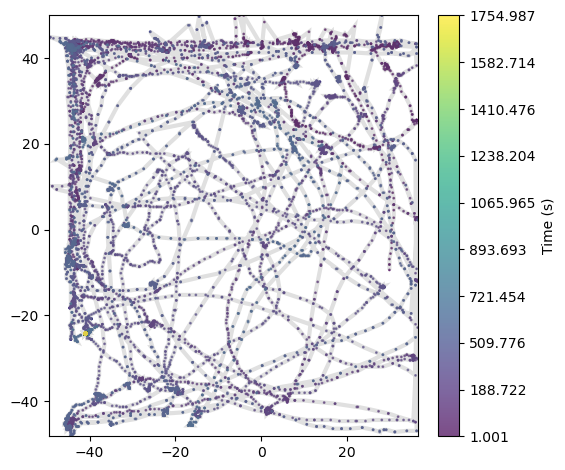

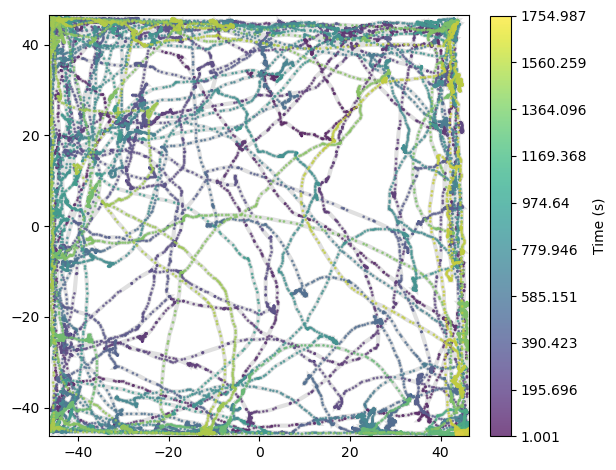

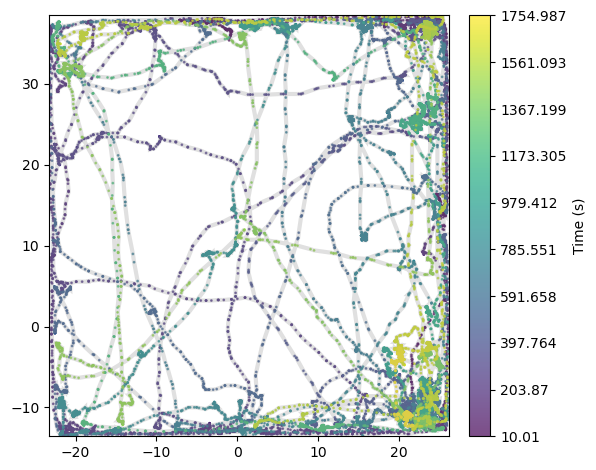

In [7]:
tr4, tr3, tr5, tr6, tr7 = openFile('Trace_4.txt'), openFile('Trace_3.txt'), openFile('Trace_5.txt'), openFile('Trace_6.txt'), openFile('Trace_7.txt')
tr91, tr92 = openFile('Trace_9.1.txt'), openFile('Trace_9.2.txt') 
tr1, tr2 = openFile('Trace_1.1.txt'), openFile('Trace_2.txt')
dfs = [tr4, tr3, tr5, tr6, tr7, tr91, tr92, tr1, tr2]
names = ['tr4','tr3','tr5','tr6','tr7', 'tr91','tr92', 'tr1','tr2']

##### я убрала первый стобец гистограммы

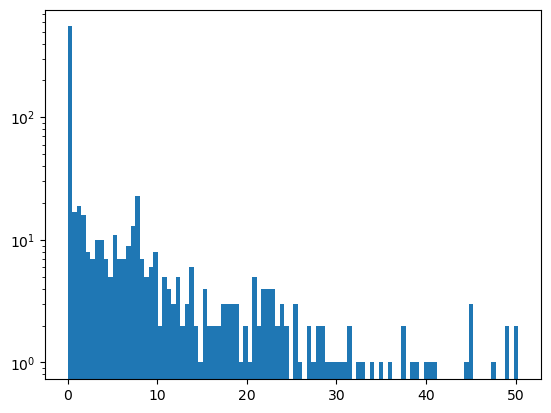

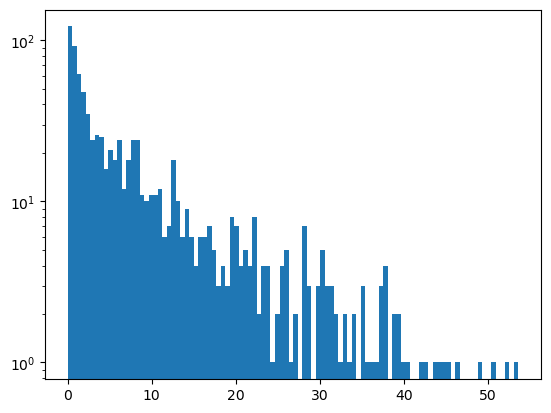

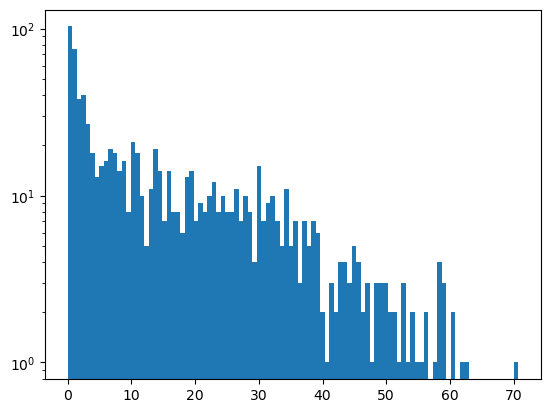

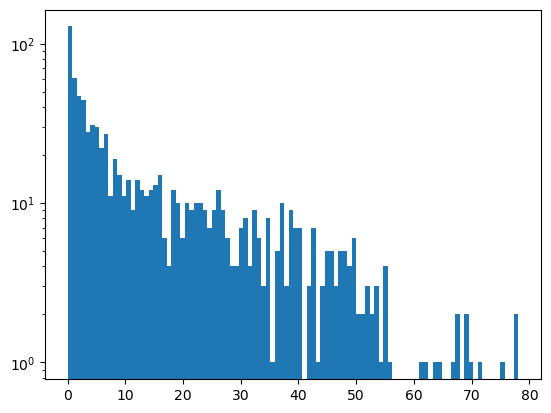

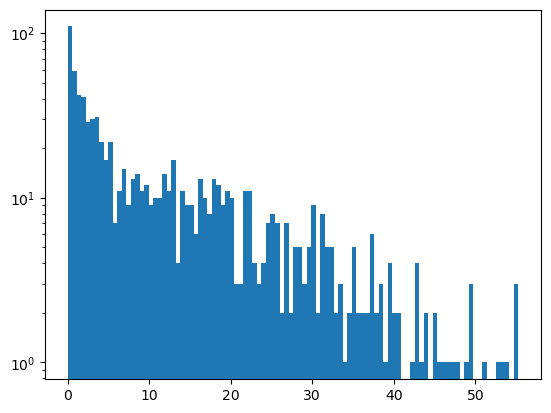

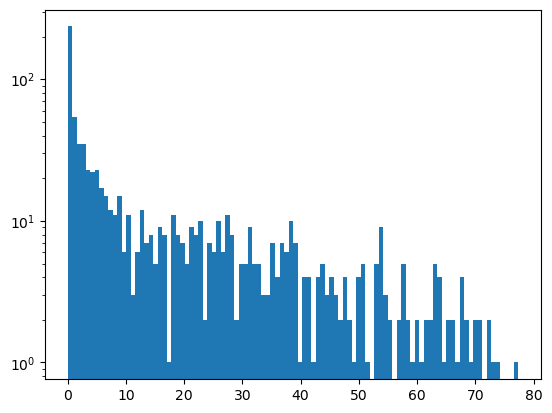

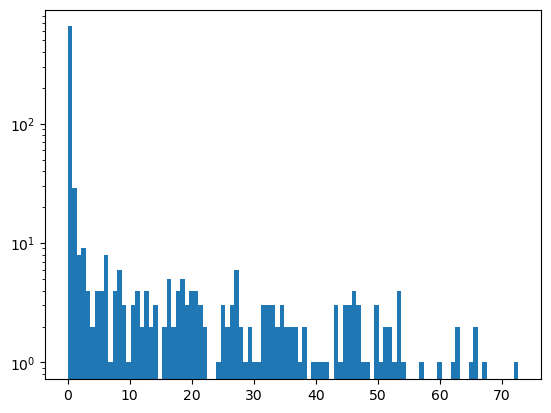

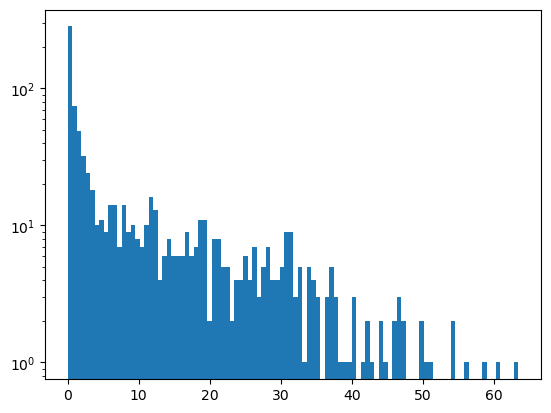

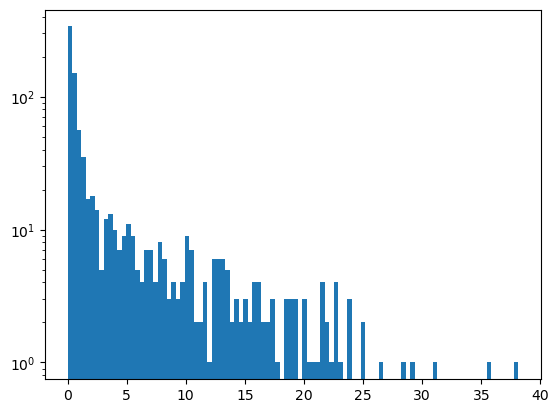

In [8]:
kks = {}
for i in range(len(dfs)):
    # т е тут построенный гистографммы со всем колонками, но я в итоге убираю первую колонку
    kks[names[i]] = build3ShistLog(dfs[i], 2)
    kks[names[i]] = (kks[names[i]][0][1:],kks[names[i]][1][1:])

In [16]:
def makeLinRegr(histOut, trn):
    x = histOut[1][1:]
    y = histOut[0]
    for i in range(len(y)):
        if y[i] == 0:
            y[i] = 0.5
    plt.figure()
    plt.title(trn)
    plt.plot(x,np.log10(y))
    x = x.reshape(-1, 1)
    #model = LinearRegression().fit(x, y)
    model = LinearRegression().fit(x, np.log10(y))
    r_sq = model.score(x, np.log10(y))
    print(trn, f"coefficient of determination: {r_sq}")
    return(r_sq)
            
    

tr4 coefficient of determination: 0.7038058711416358
tr3 coefficient of determination: 0.8260951054298371
tr5 coefficient of determination: 0.8458371475595404
tr6 coefficient of determination: 0.8031795954547836
tr7 coefficient of determination: 0.8013465727828781
tr91 coefficient of determination: 0.6272839069987695
tr92 coefficient of determination: 0.4472855354510902
tr1 coefficient of determination: 0.8001371852377337
tr2 coefficient of determination: 0.7702128377990611


0.7702128377990611

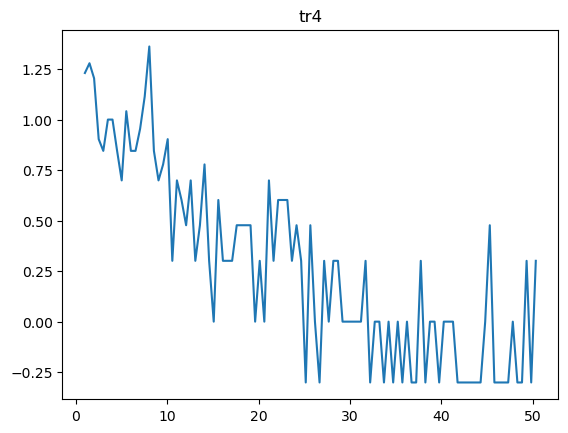

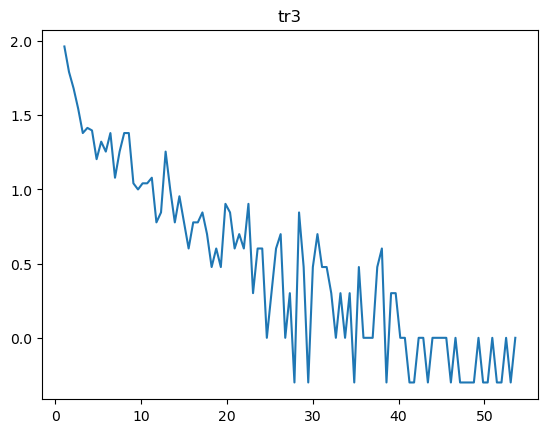

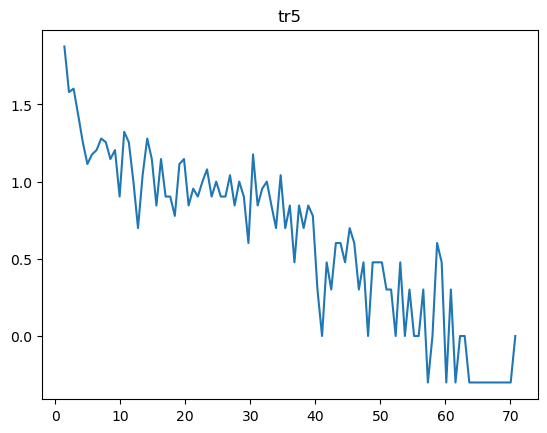

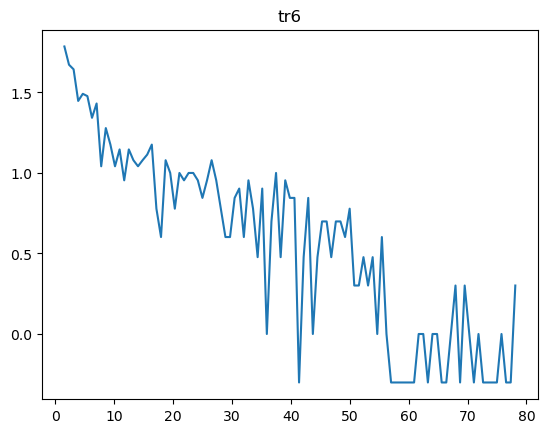

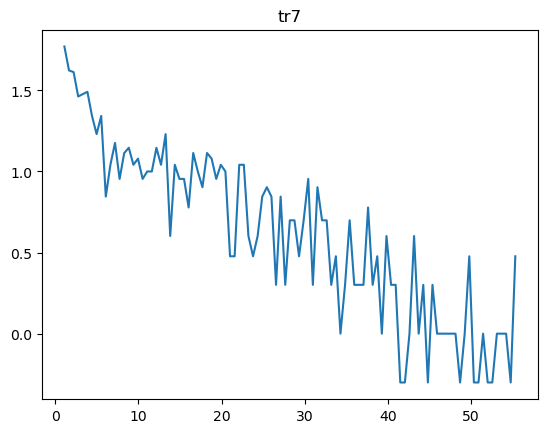

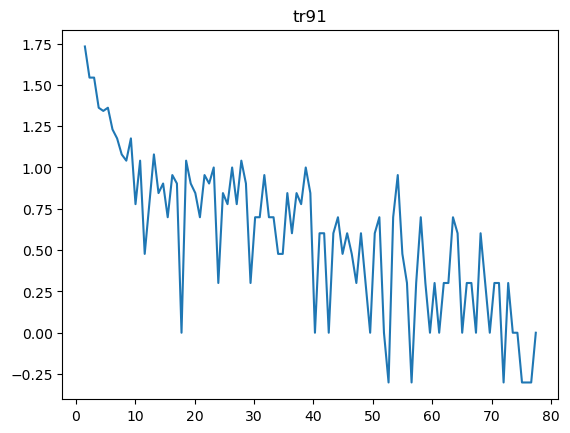

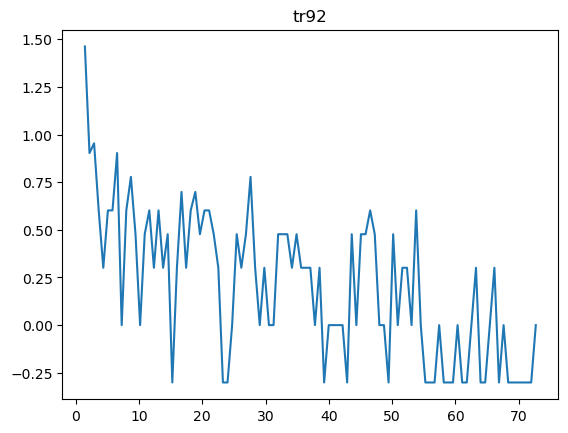

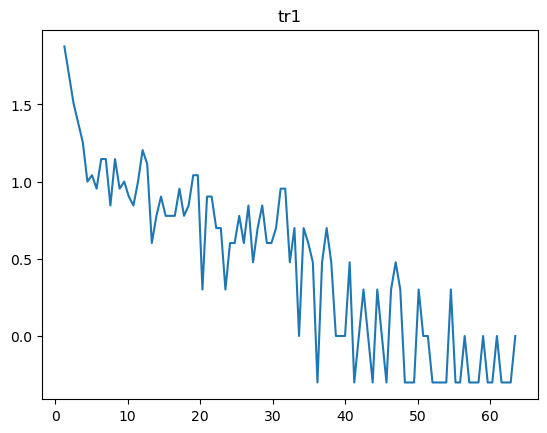

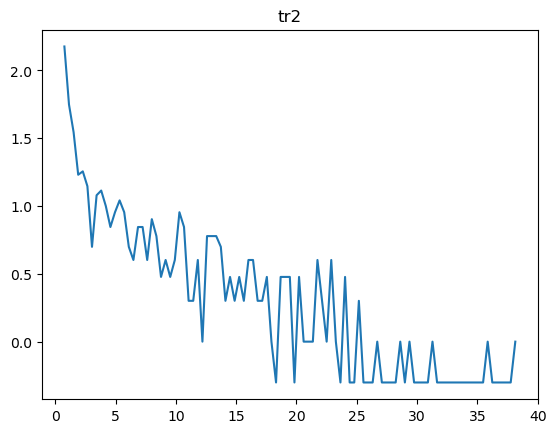

In [17]:
makeLinRegr(kks['tr4'],'tr4')
makeLinRegr(kks['tr3'],'tr3')
makeLinRegr(kks['tr5'],'tr5')
makeLinRegr(kks['tr6'],'tr6')
makeLinRegr(kks['tr7'],'tr7')
makeLinRegr(kks['tr91'],'tr91')
makeLinRegr(kks['tr92'],'tr92')
makeLinRegr(kks['tr1'],'tr1')
makeLinRegr(kks['tr2'],'tr2')

In [18]:
def makeKSofHist(q):
    kks = {}
    for i in range(len(dfs)):
        kks[names[i]] = build3ShistLog(dfs[i], q)
        kks[names[i]] = (kks[names[i]][0][1:],kks[names[i]][1][1:])
    makeLinRegr(kks['tr4'],'tr4 ' + str(q)+'s')
    makeLinRegr(kks['tr3'],'tr3 ' + str(q)+'s')
    makeLinRegr(kks['tr5'],'tr5 ' + str(q)+'s')
    makeLinRegr(kks['tr6'],'tr6 ' + str(q)+'s')
    makeLinRegr(kks['tr7'],'tr7 ' + str(q)+'s')
    makeLinRegr(kks['tr91'],'tr91 ' + str(q)+'s')
    makeLinRegr(kks['tr92'],'tr92 ' + str(q)+'s')
    makeLinRegr(kks['tr1'],'tr1 ' + str(q)+'s')
    makeLinRegr(kks['tr2'],'tr2 ' + str(q)+'s')
    

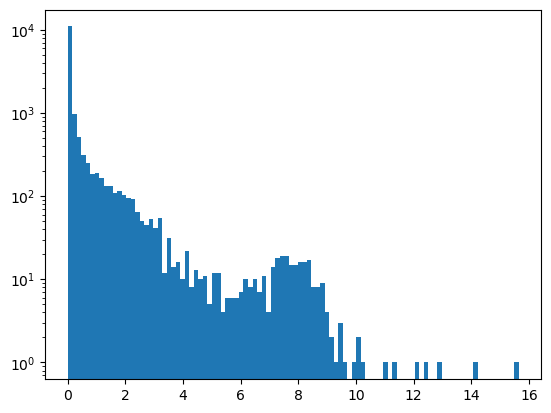

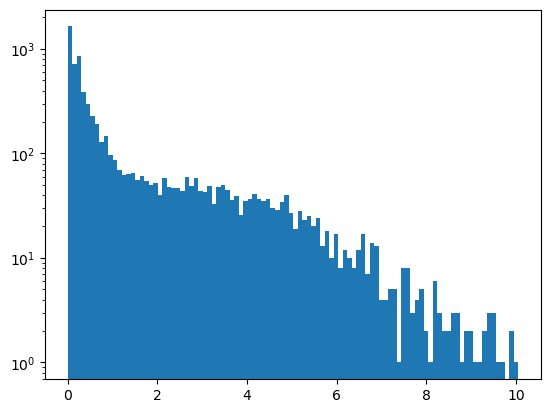

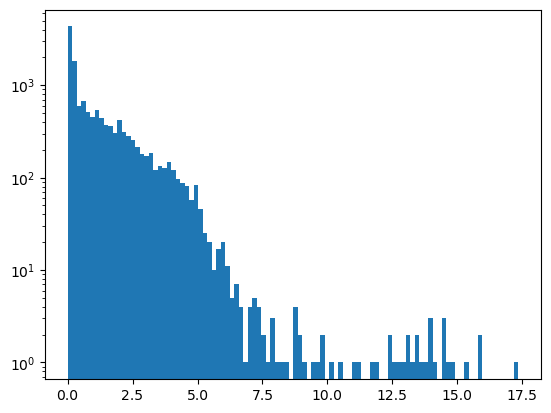

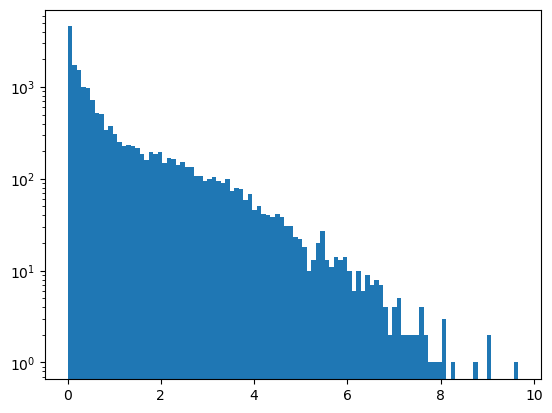

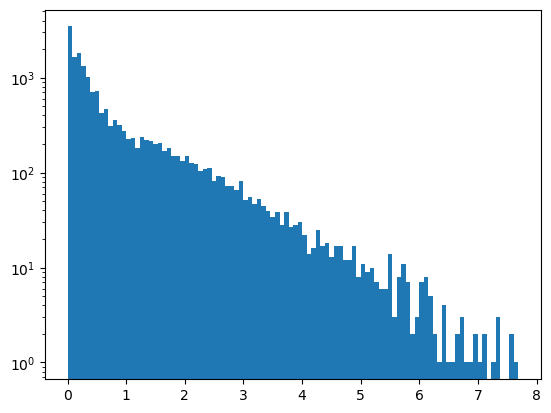

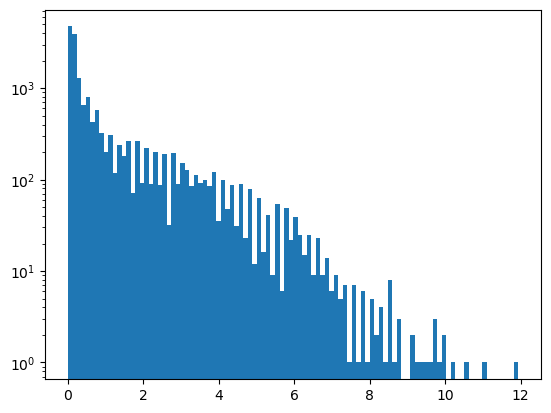

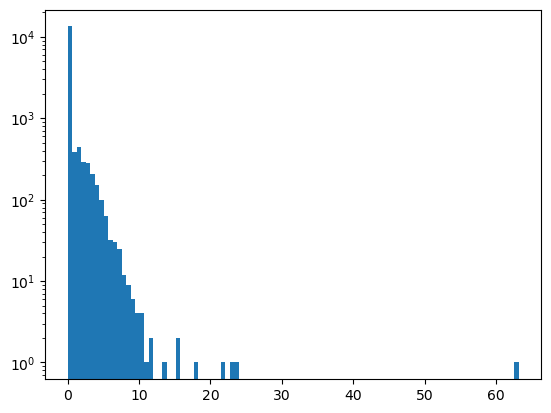

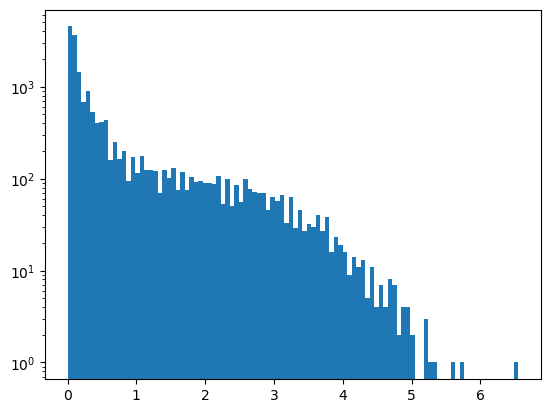

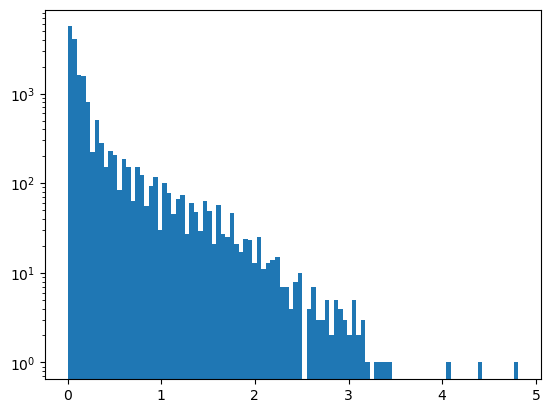

tr4 0.1s coefficient of determination: 0.8661425077847453
tr3 0.1s coefficient of determination: 0.9015759563724429
tr5 0.1s coefficient of determination: 0.7916650661736666
tr6 0.1s coefficient of determination: 0.9695819676958952
tr7 0.1s coefficient of determination: 0.9621511658718873
tr91 0.1s coefficient of determination: 0.9177588616885506
tr92 0.1s coefficient of determination: 0.42080035139007943
tr1 0.1s coefficient of determination: 0.9188337705628565
tr2 0.1s coefficient of determination: 0.917862060903585


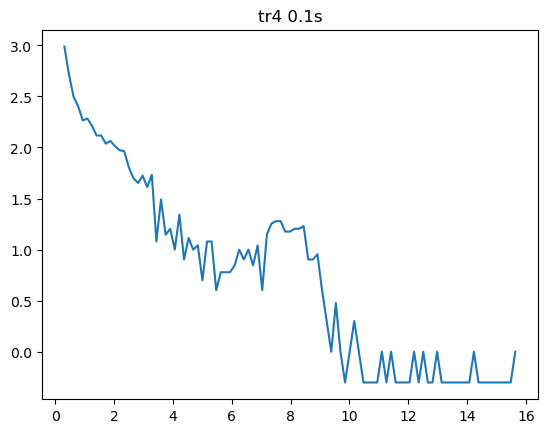

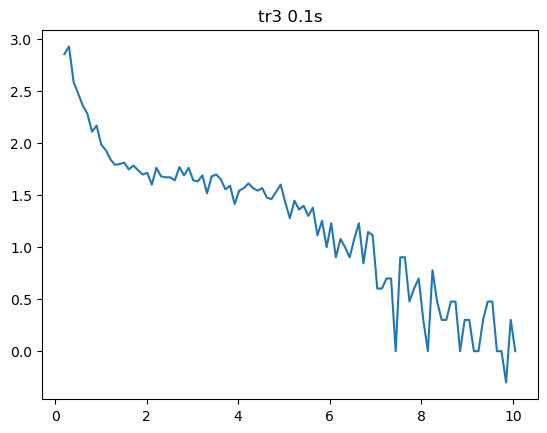

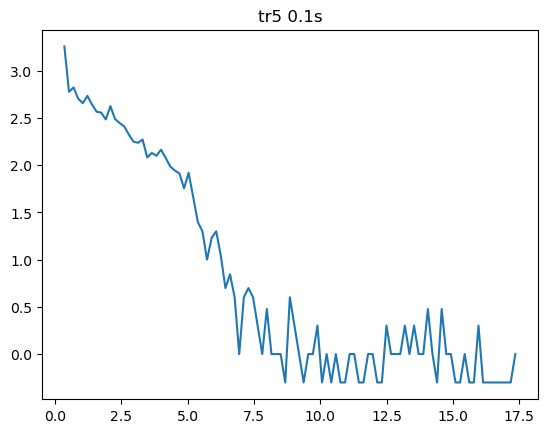

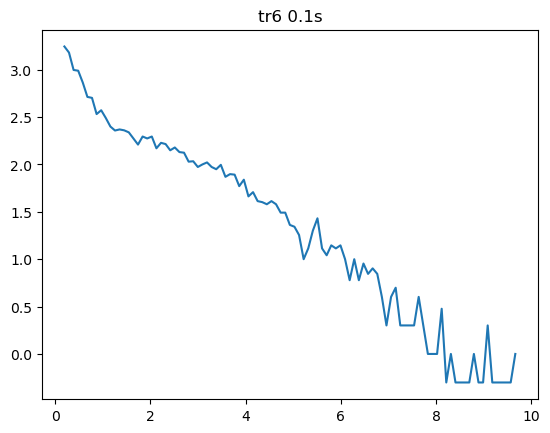

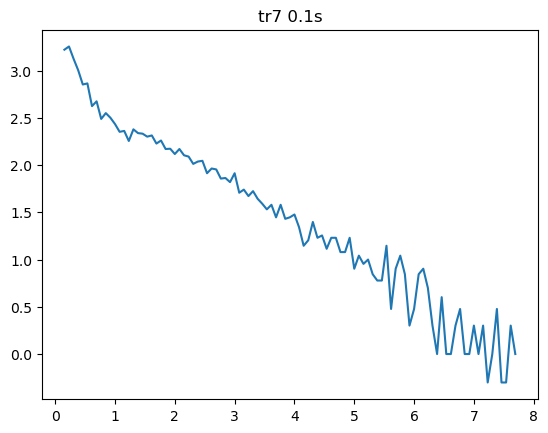

...

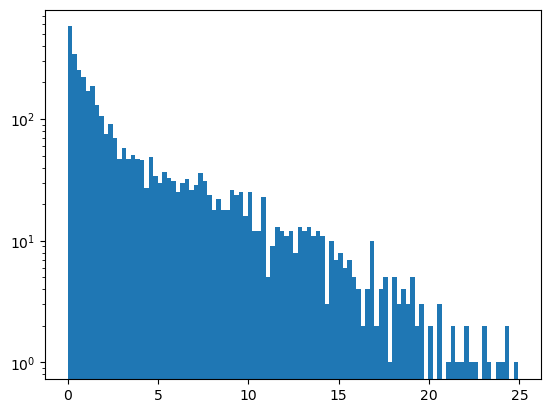

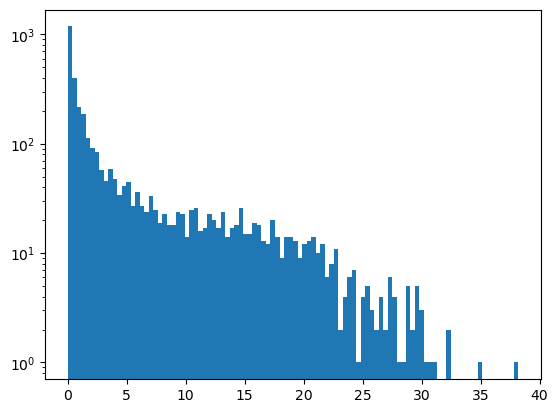

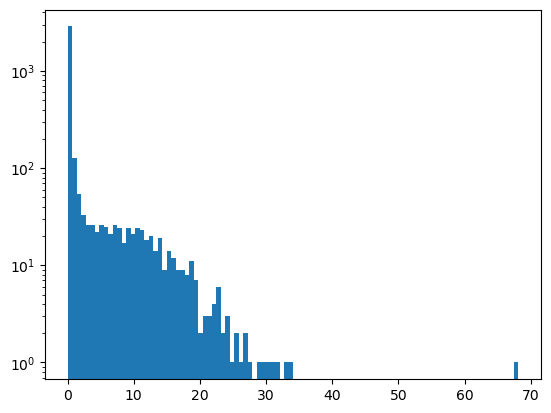

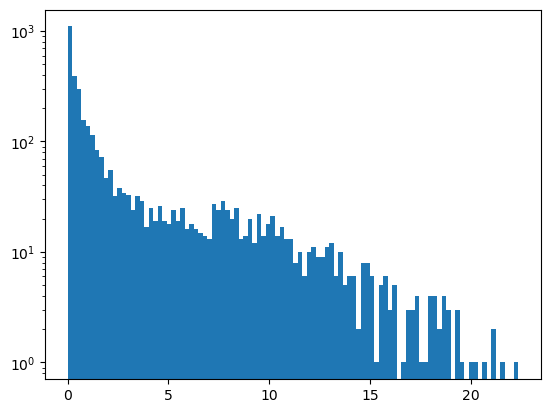

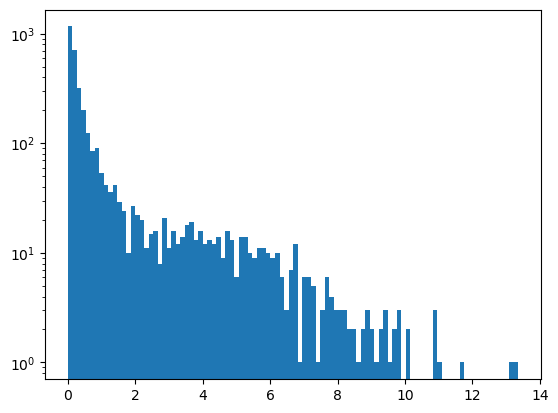

tr4 0.5s coefficient of determination: 0.8791257339248911
tr3 0.5s coefficient of determination: 0.9017939683095557
tr5 0.5s coefficient of determination: 0.9019343382474022
tr6 0.5s coefficient of determination: 0.8999033436051531
tr7 0.5s coefficient of determination: 0.9142915479538871
tr91 0.5s coefficient of determination: 0.8969408647496715
tr92 0.5s coefficient of determination: 0.7764395688212532
tr1 0.5s coefficient of determination: 0.8564384881439939
tr2 0.5s coefficient of determination: 0.8717008502881635


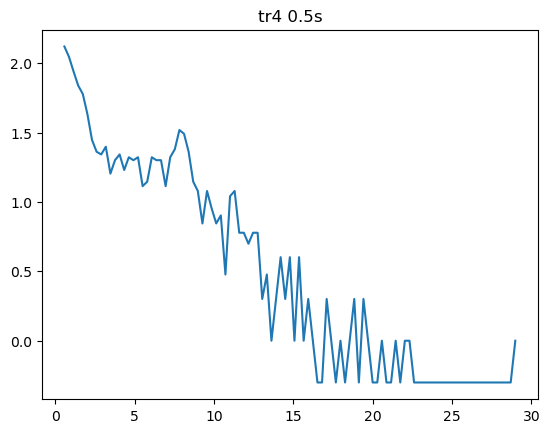

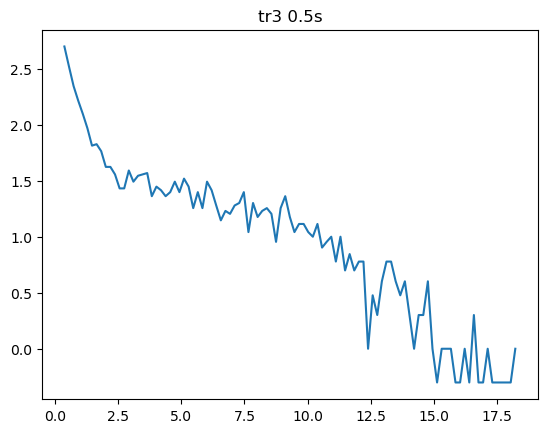

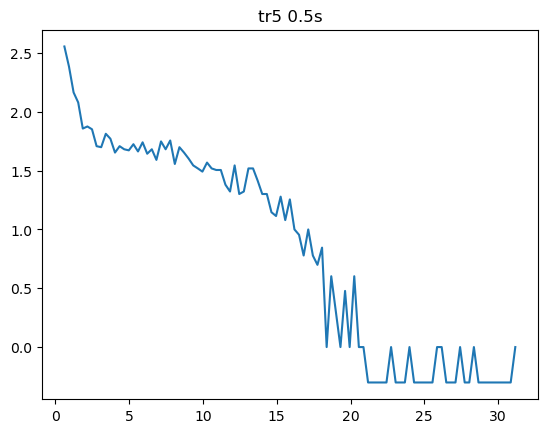

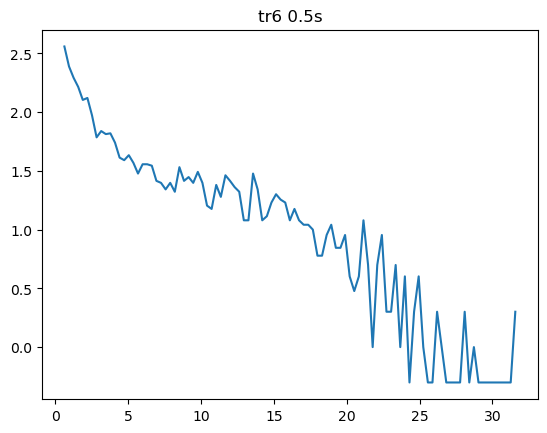

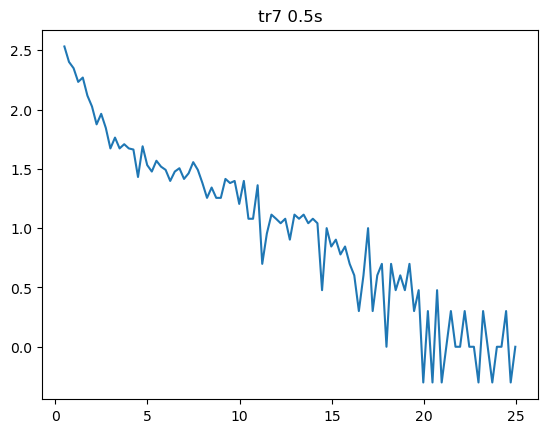

...

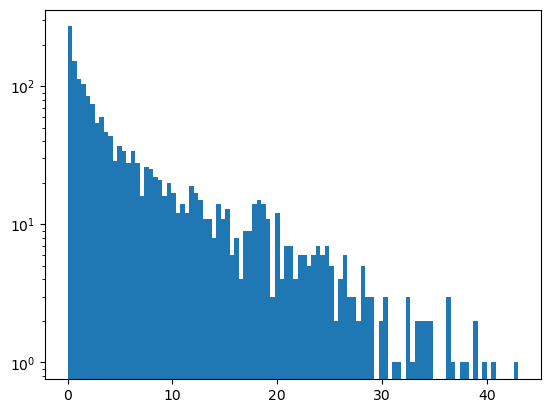

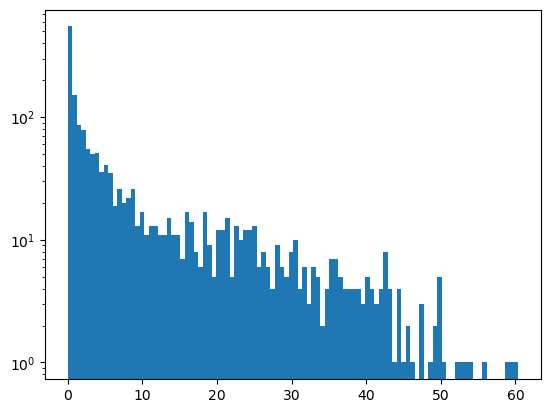

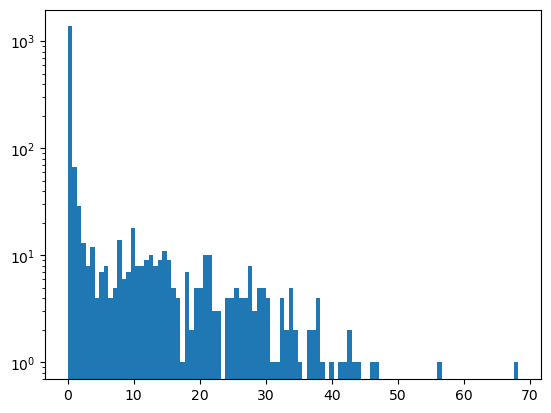

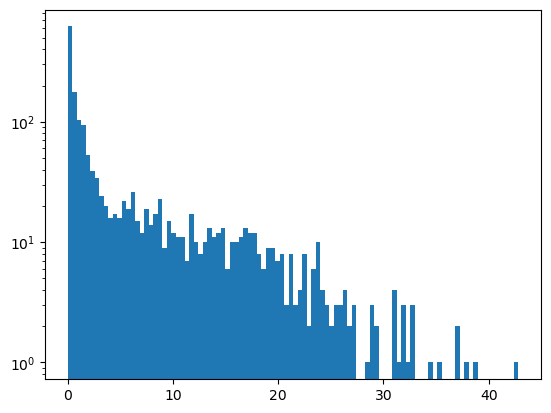

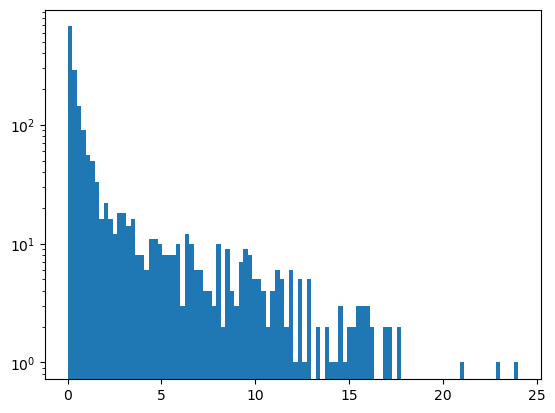

tr4 1s coefficient of determination: 0.8455311101886333
tr3 1s coefficient of determination: 0.8707817509516227
tr5 1s coefficient of determination: 0.900503367151727
tr6 1s coefficient of determination: 0.9031978675609104
tr7 1s coefficient of determination: 0.8968776814592512
tr91 1s coefficient of determination: 0.8559223780524032
tr92 1s coefficient of determination: 0.7777736992004688
tr1 1s coefficient of determination: 0.8656776166787739
tr2 1s coefficient of determination: 0.8139396562201584


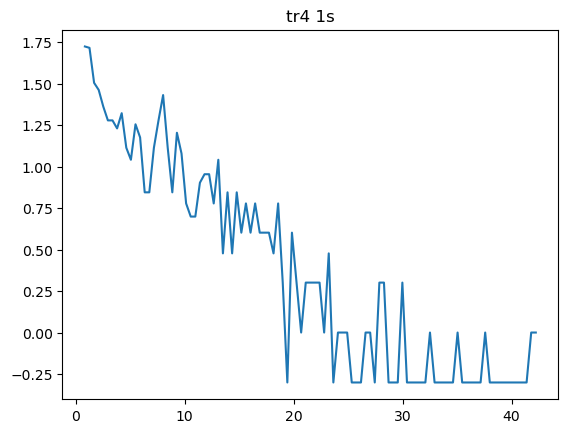

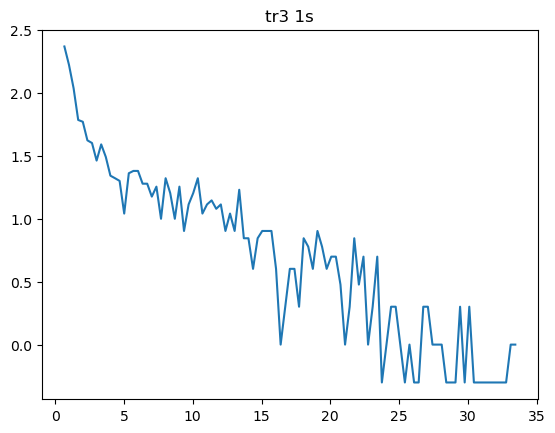

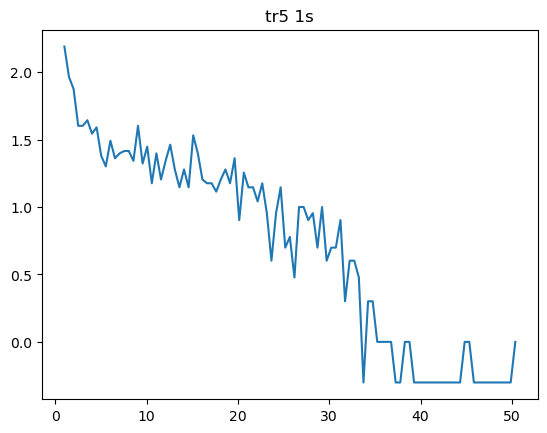

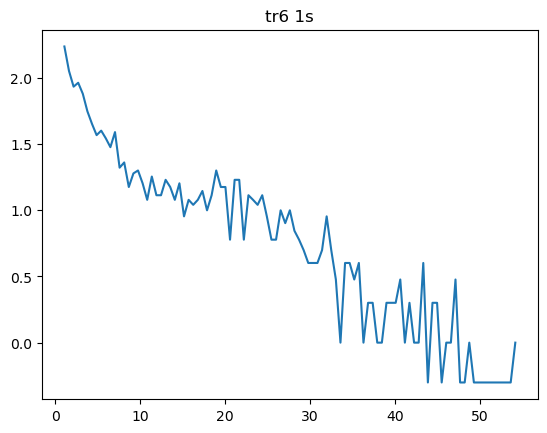

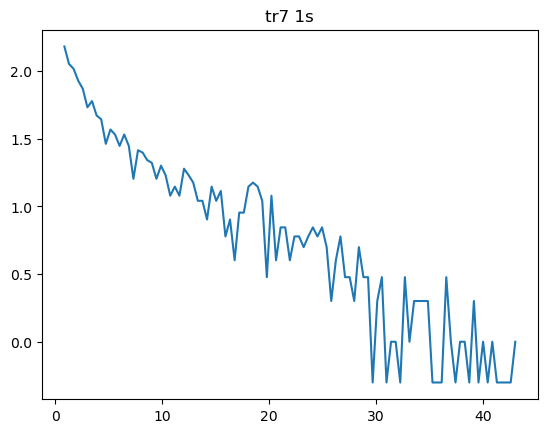

...

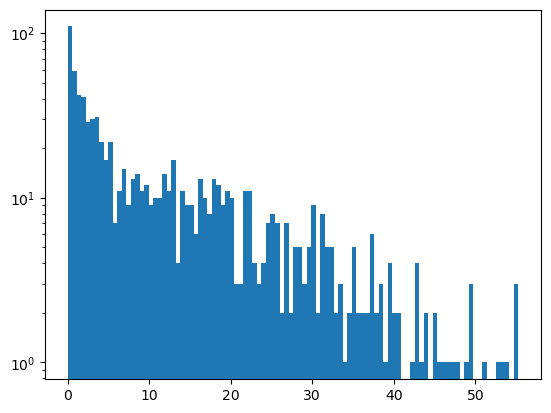

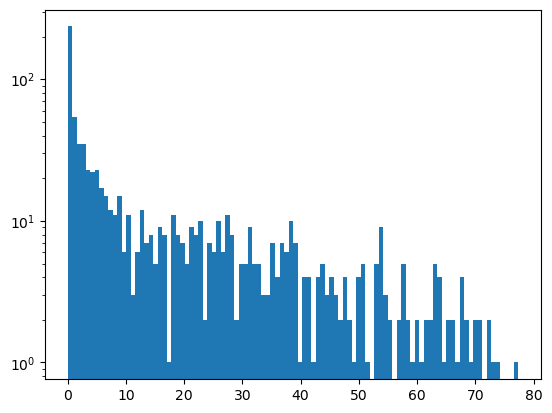

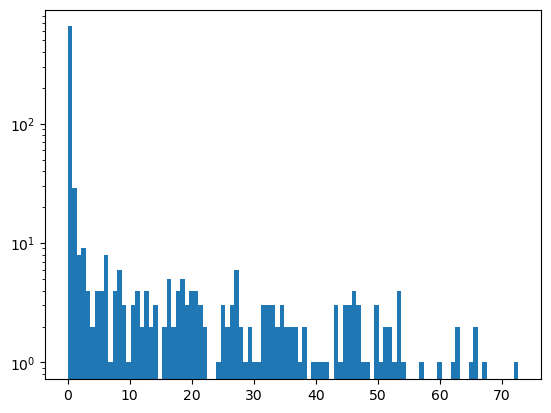

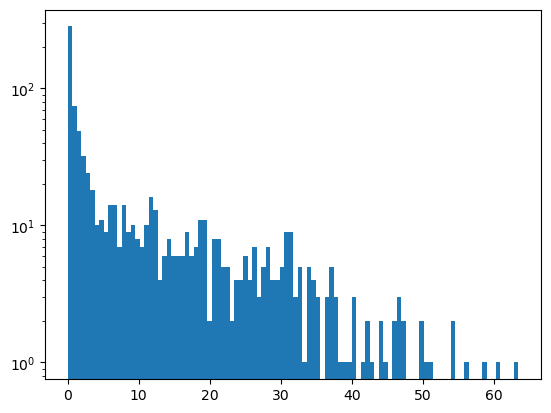

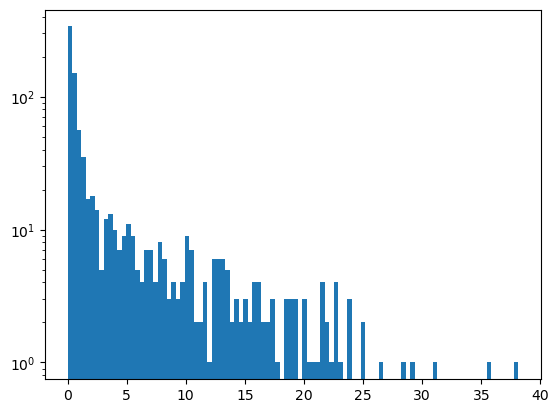

tr4 2s coefficient of determination: 0.7038058711416358
tr3 2s coefficient of determination: 0.8260951054298371
tr5 2s coefficient of determination: 0.8458371475595404
tr6 2s coefficient of determination: 0.8031795954547836
tr7 2s coefficient of determination: 0.8013465727828781
tr91 2s coefficient of determination: 0.6272839069987695
tr92 2s coefficient of determination: 0.4472855354510902
tr1 2s coefficient of determination: 0.8001371852377337
tr2 2s coefficient of determination: 0.7702128377990611


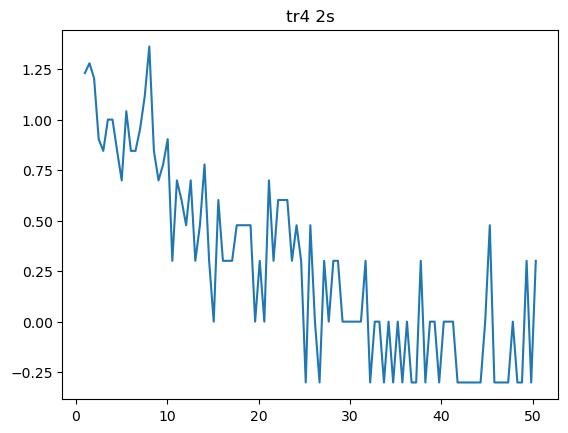

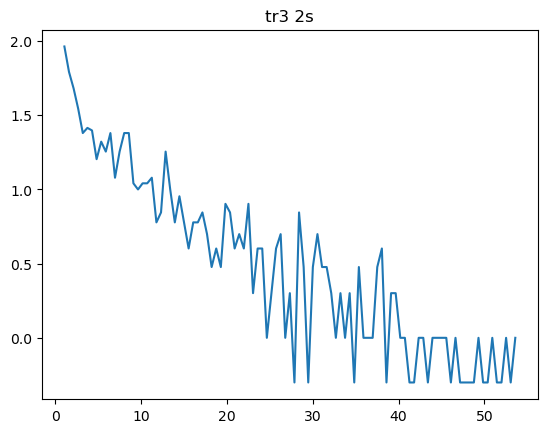

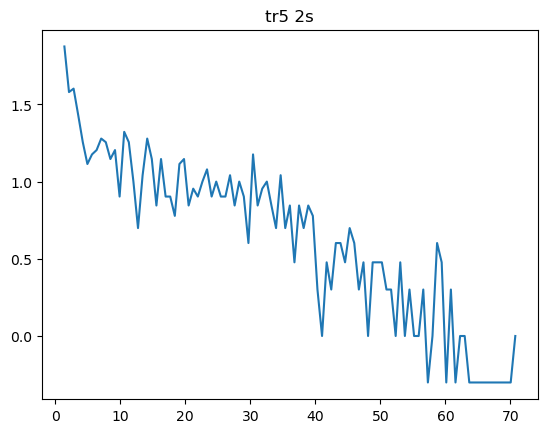

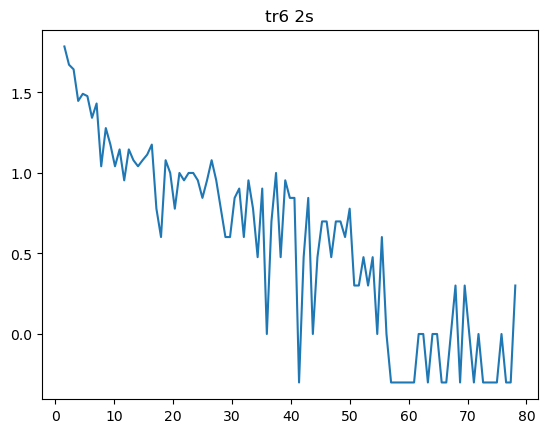

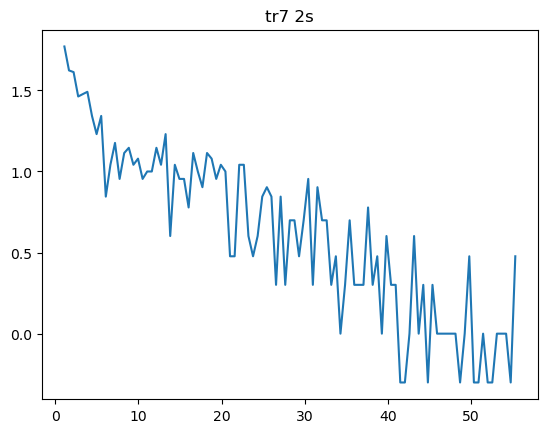

...

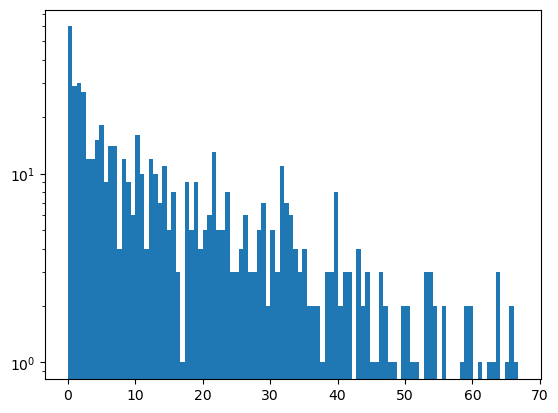

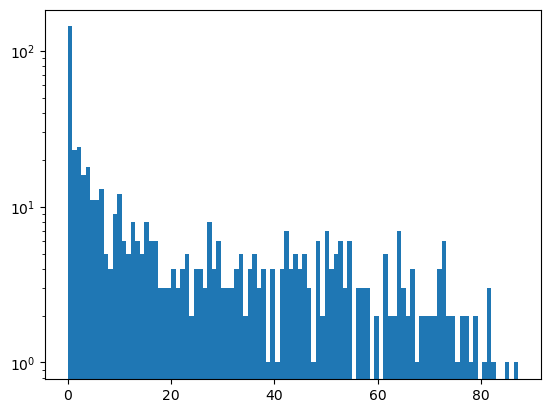

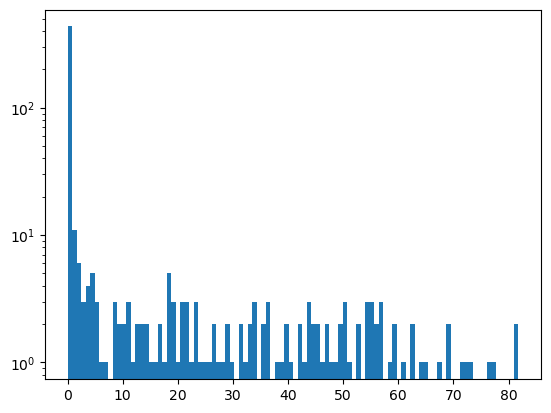

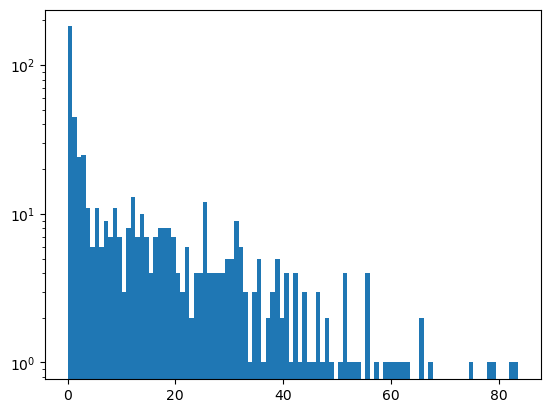

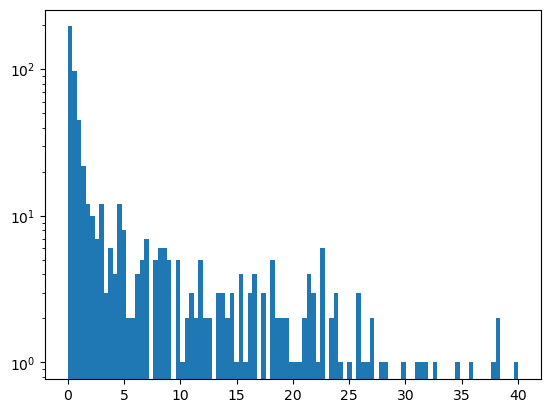

tr4 3s coefficient of determination: 0.578092848144464
tr3 3s coefficient of determination: 0.7785074804292418
tr5 3s coefficient of determination: 0.7609408542811871
tr6 3s coefficient of determination: 0.8899550590932507
tr7 3s coefficient of determination: 0.6906309331357575
tr91 3s coefficient of determination: 0.503437020974546
tr92 3s coefficient of determination: 0.27158341222409466
tr1 3s coefficient of determination: 0.7798982751185383
tr2 3s coefficient of determination: 0.5546687807699215


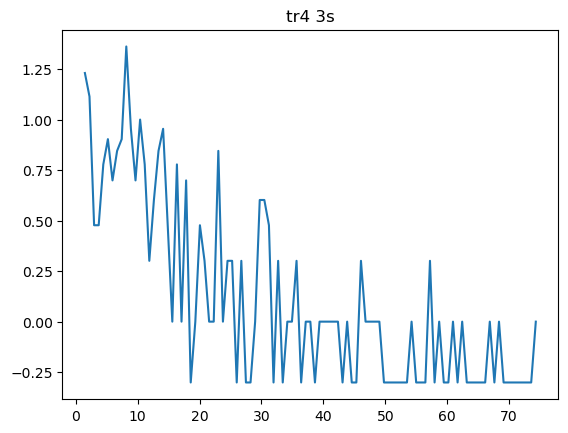

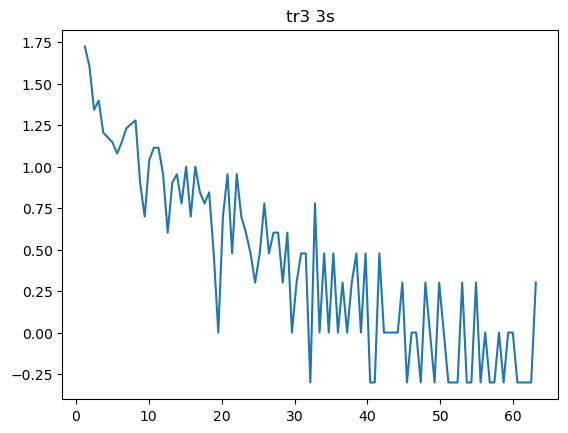

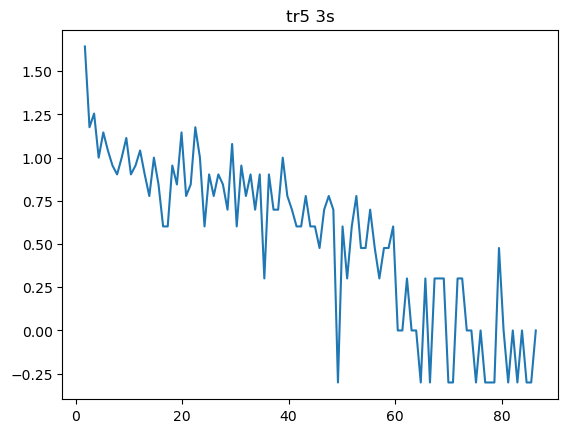

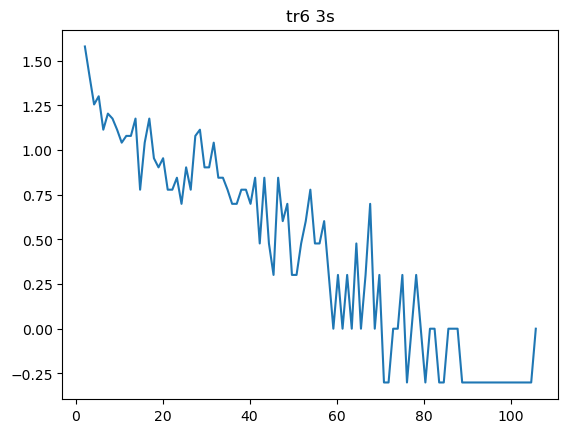

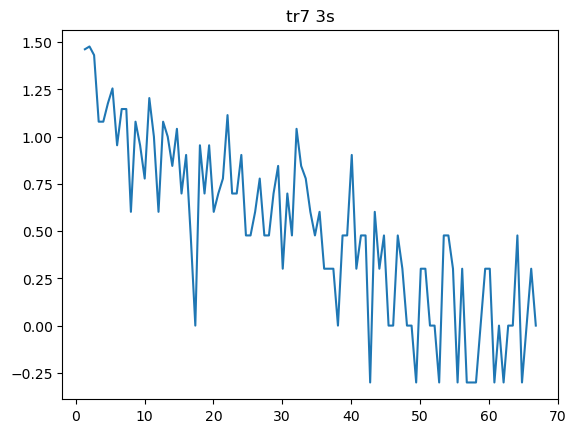

...

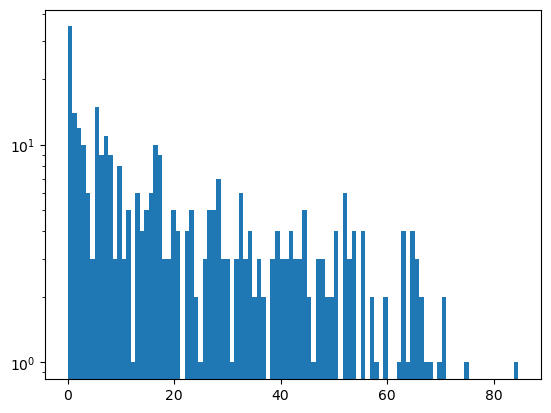

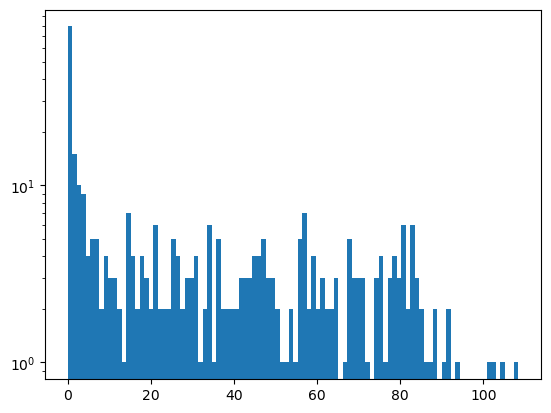

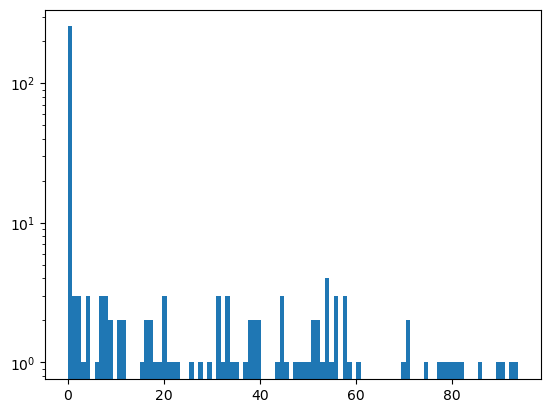

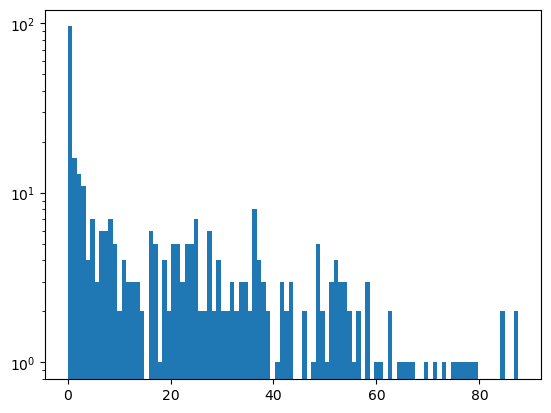

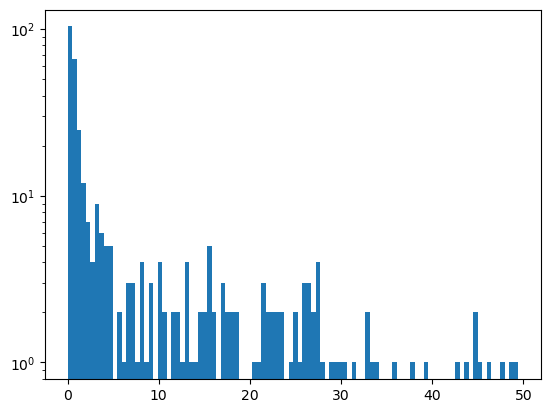

tr4 5s coefficient of determination: 0.45970919916388064
tr3 5s coefficient of determination: 0.7492411282985915
tr5 5s coefficient of determination: 0.40717850744380135
tr6 5s coefficient of determination: 0.6128013188655536
tr7 5s coefficient of determination: 0.5706333557038074
tr91 5s coefficient of determination: 0.3766482324491963
tr92 5s coefficient of determination: 0.12213556284619531
tr1 5s coefficient of determination: 0.5351631650546229
tr2 5s coefficient of determination: 0.4060163184325306


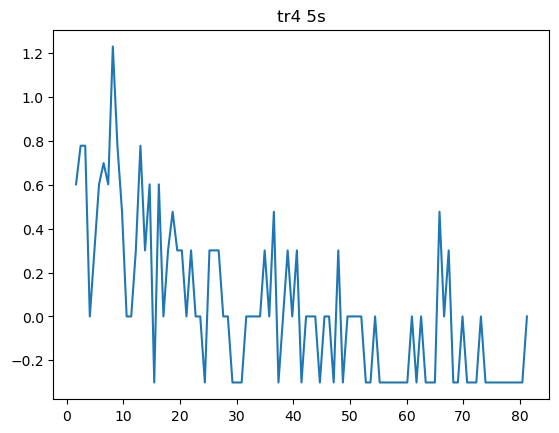

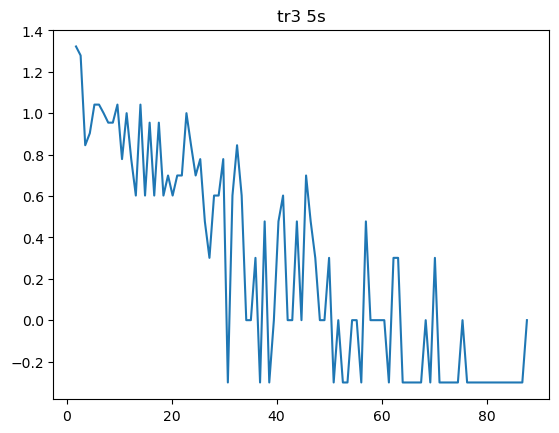

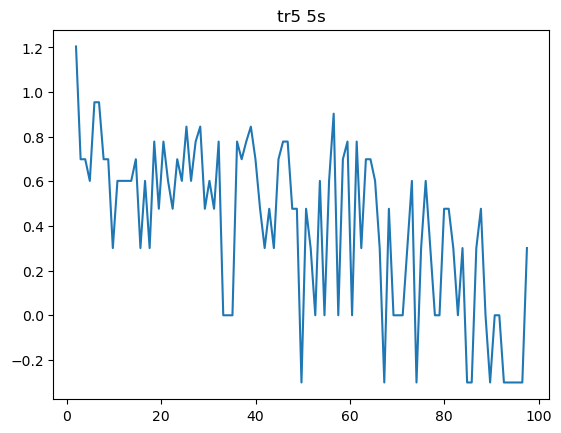

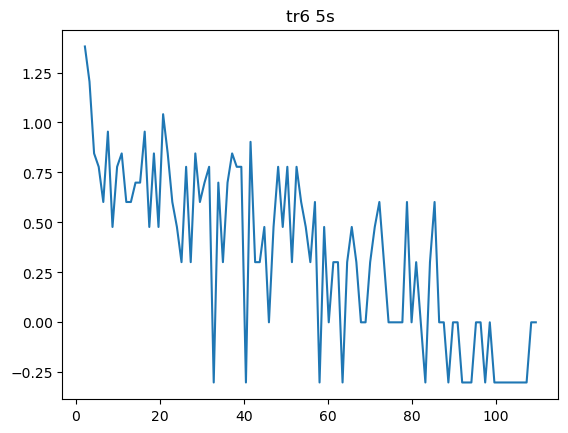

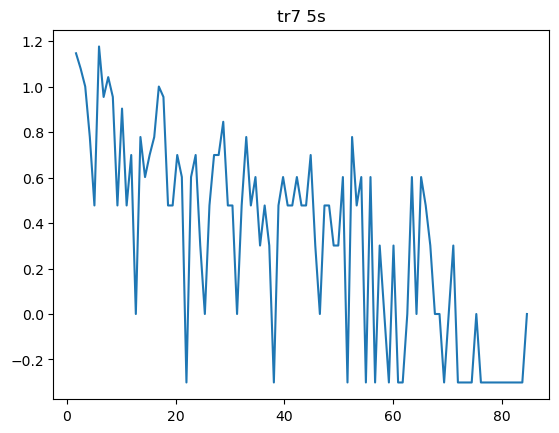

...

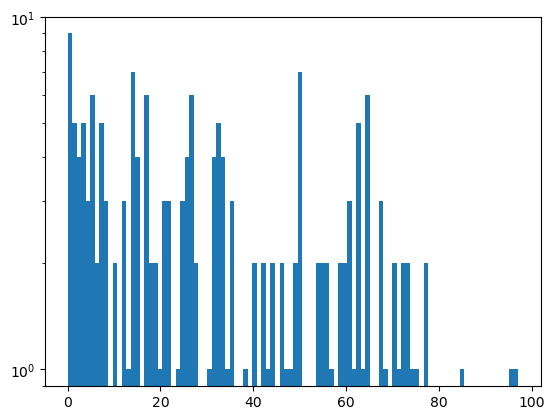

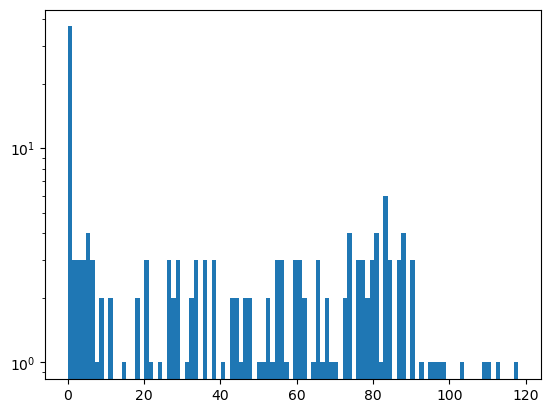

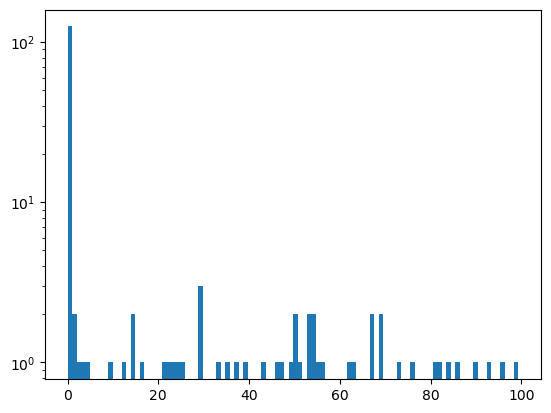

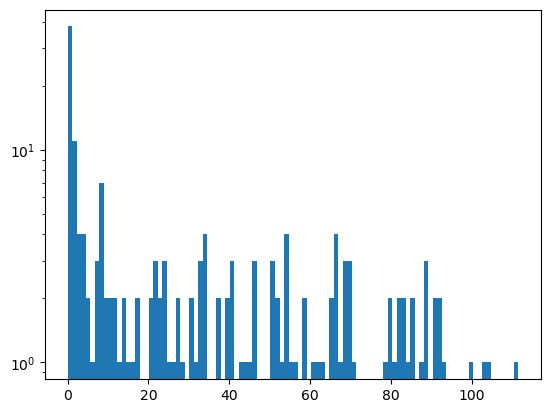

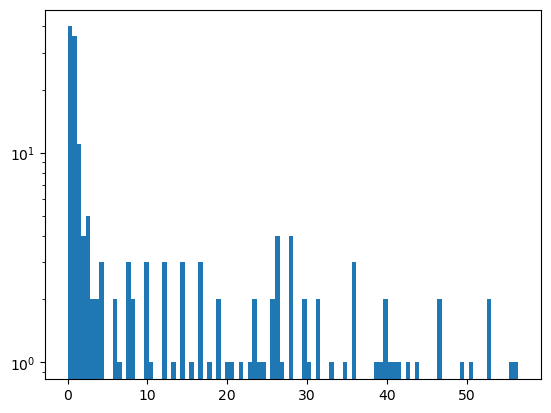

tr4 10s coefficient of determination: 0.18092059845535402
tr3 10s coefficient of determination: 0.4509351888783205
tr5 10s coefficient of determination: 0.19696430654632913
tr6 10s coefficient of determination: 0.2010698545805336
tr7 10s coefficient of determination: 0.2633264252889991
tr91 10s coefficient of determination: 0.0451946432128435
tr92 10s coefficient of determination: 0.0116987328225856
tr1 10s coefficient of determination: 0.20157434665568597
tr2 10s coefficient of determination: 0.1631179994362396


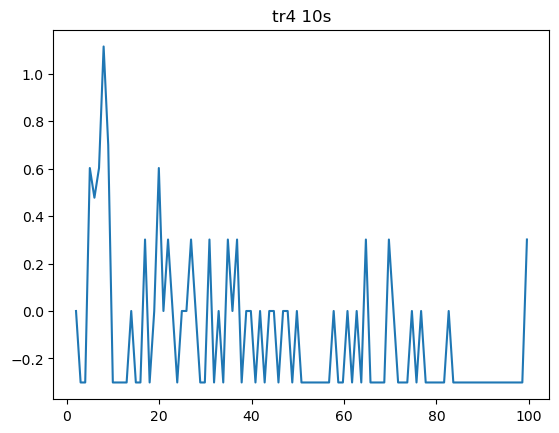

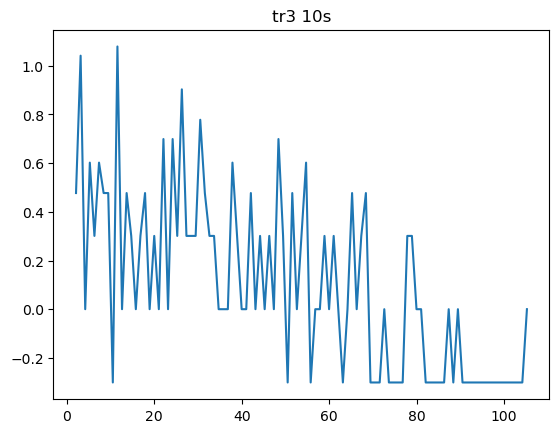

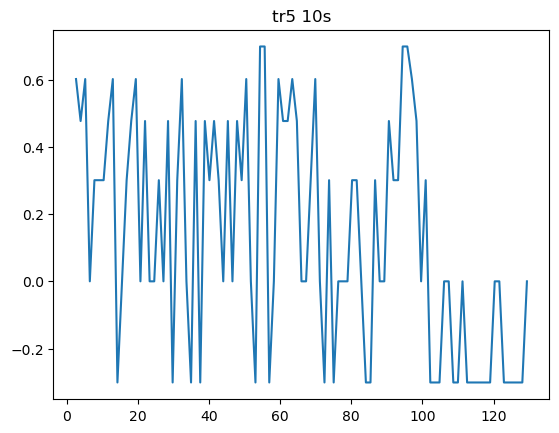

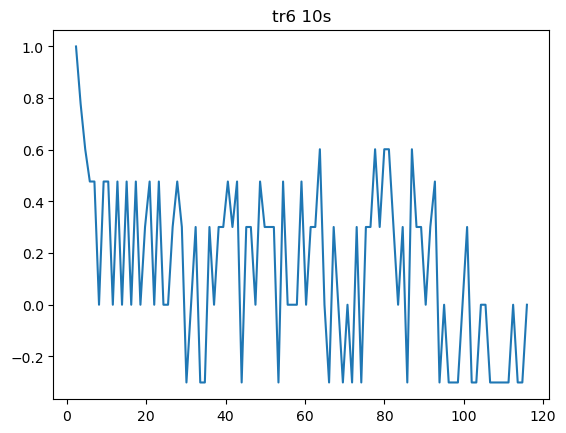

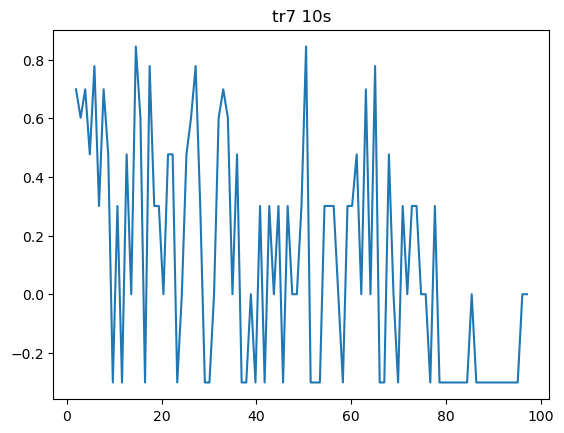

...

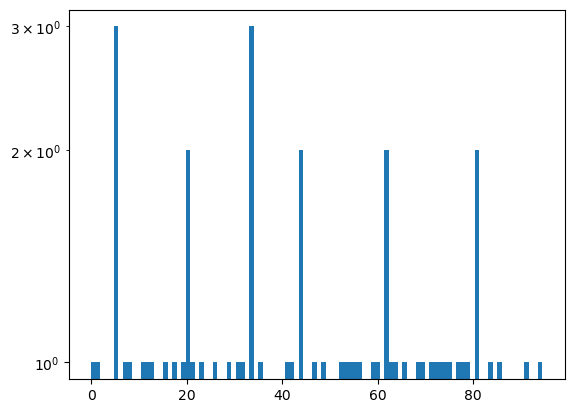

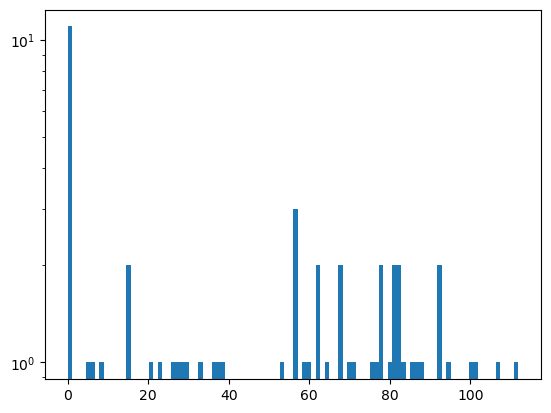

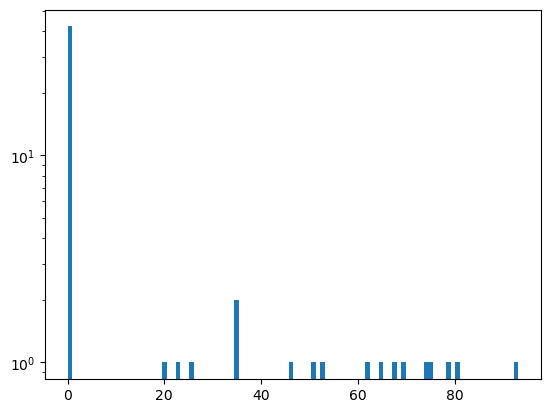

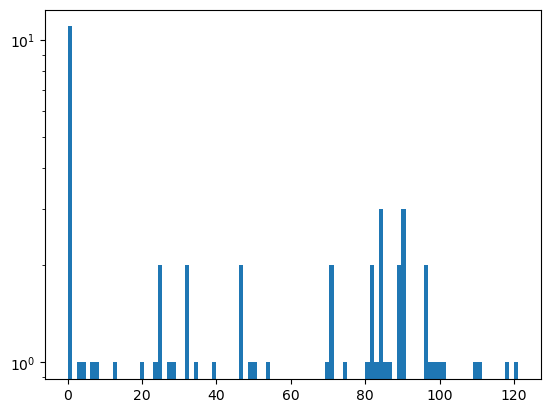

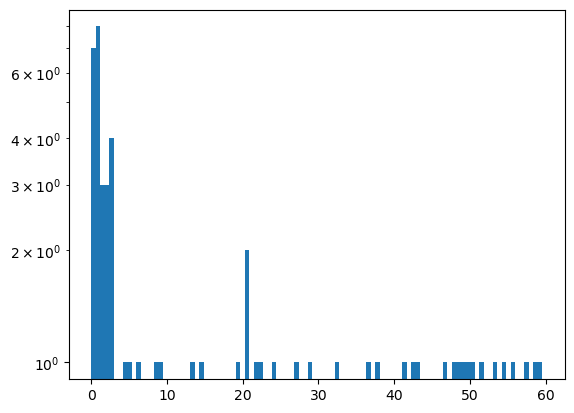

tr4 30s coefficient of determination: 0.00803895225562501
tr3 30s coefficient of determination: 0.01072230289363818
tr5 30s coefficient of determination: 0.006588845357119233
tr6 30s coefficient of determination: 0.004143748007813475
tr7 30s coefficient of determination: 0.0011820315095010248
tr91 30s coefficient of determination: 0.00936094103403351
tr92 30s coefficient of determination: 0.020687109014460137
tr1 30s coefficient of determination: 0.0038081872907635983
tr2 30s coefficient of determination: 0.02763478029837907


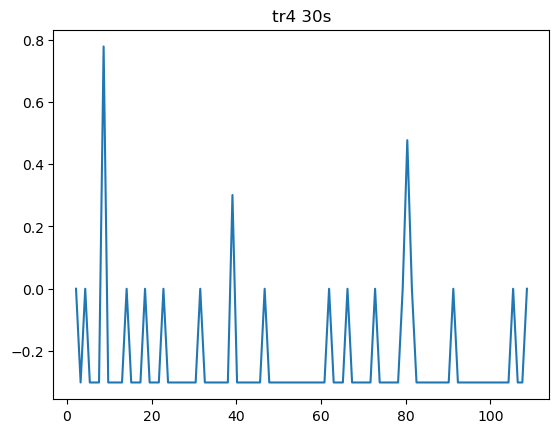

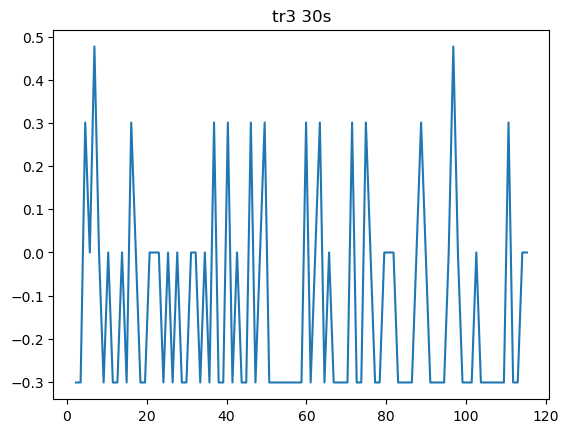

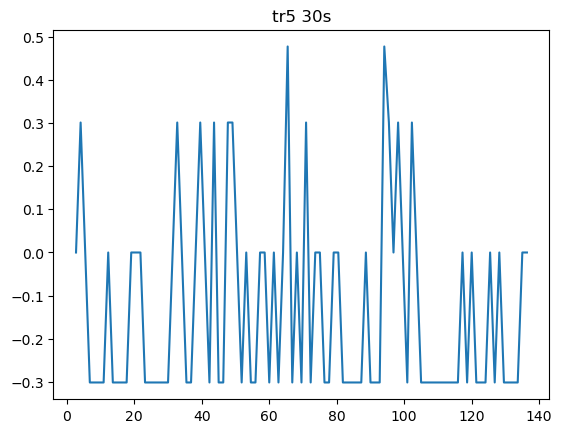

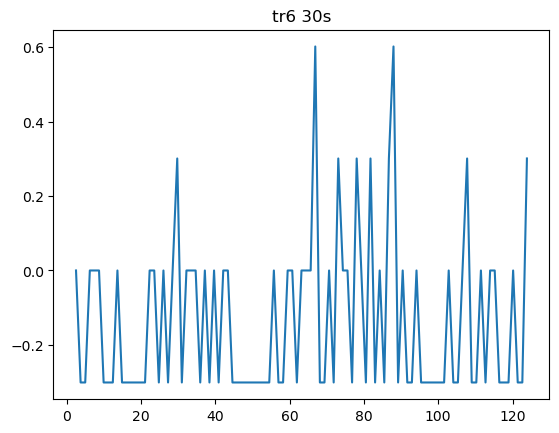

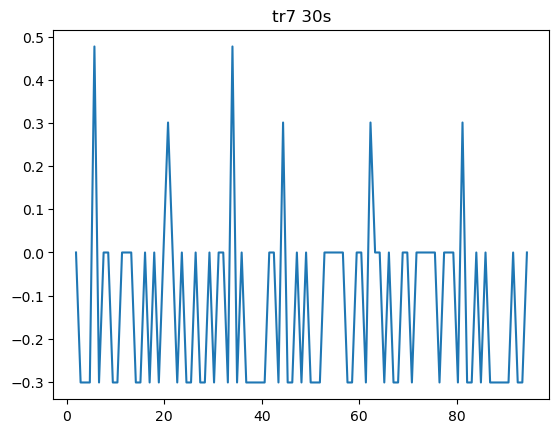

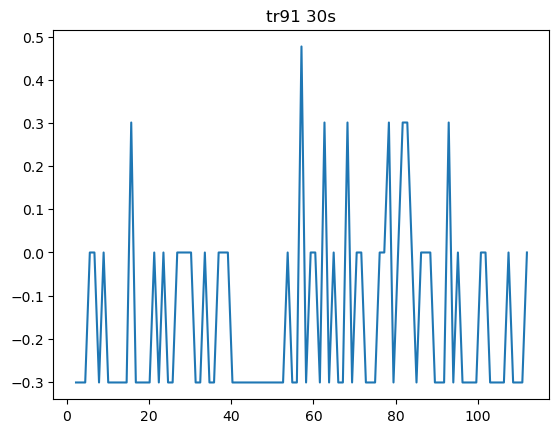

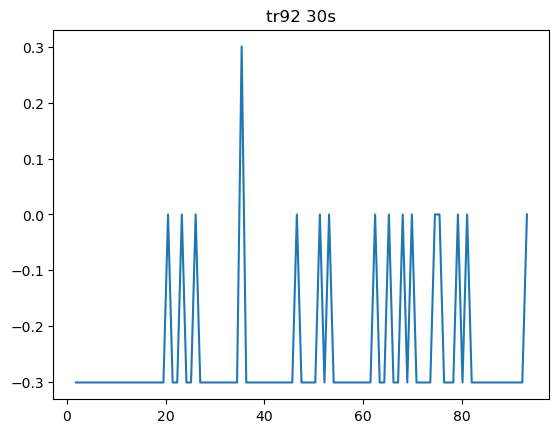

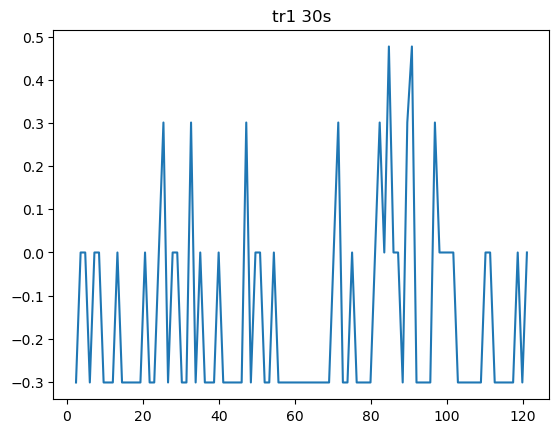

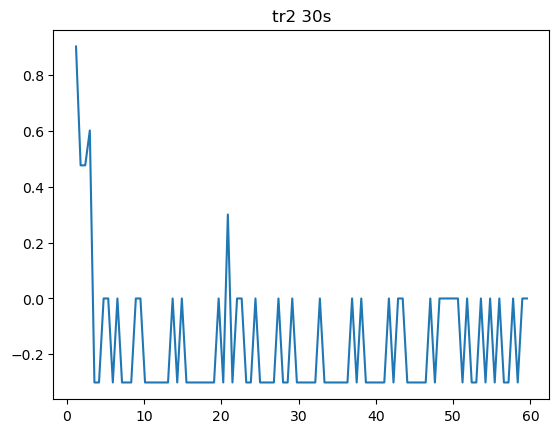

In [19]:
stepLengths = [0.1, 0.5, 1, 2, 3, 5, 10, 30]
for q in stepLengths:
    makeKSofHist(q)

##### log log

In [ ]:
kks = {}
for i in range(len(dfs)):
    # т е тут построенный гистографммы со всем колонками, но я в итоге убираю первую колонку
    kks[names[i]] = build3ShistLog(dfs[i], 2)
    kks[names[i]] = (kks[names[i]][0][1:],kks[names[i]][1][1:])

### draft

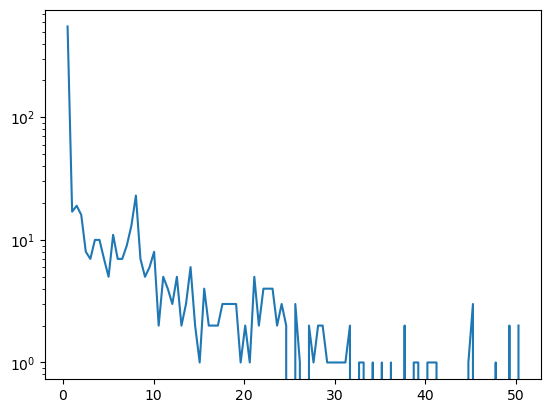

In [87]:
x = kks['tr4'][1][1:]
y = kks['tr4'][0]
plt.yscale("log")
plt.plot(x,y)

In [94]:
for i in range(len(y)):
    if y[i] == 0:
        y[i] = 0.5

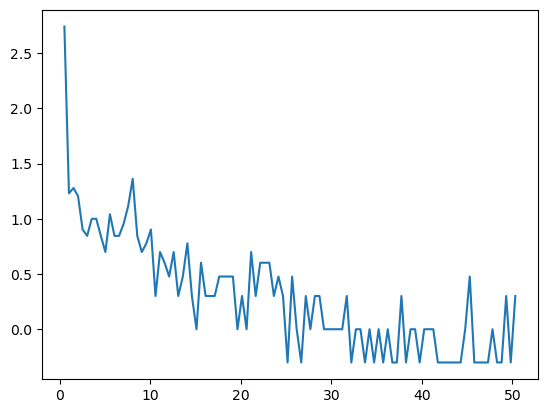

In [95]:
plt.plot(x,np.log10(y))

In [98]:
x = x.reshape(-1, 1)
x.shape

(100, 1)

In [99]:
model = LinearRegression().fit(x, y)
r_sq = model.score(x, y)
print(f"coefficient of determination: {r_sq}")

coefficient of determination: 0.05032804255090606


### проверим наши данные по распределению 3с шагов

In [34]:
#import math

def build3Shist(df,n):
    sampRate = len(df) / (df.iloc[-1]['time'] - df.iloc[0]['time'])
    step = round(sampRate * n)
    #chose which samples will remain
    k = []
    if step == 0:
        step = 1
    for i in range(len(df)):
        if i % step == 0:
            k.append(i)
    df = df.iloc[k]
    
    xy = []
    x0 = df['x'][0]
    y0 = df['y'][0]
    #delX = []
    #delY = []
    for i in range(len(df)):
        dx = df.iloc[i]['x'] - x0
        dy = df.iloc[i]['y'] - y0
        xxy = pow(pow(dx, 2) + pow(dy, 2), 0.5)
        #delX.append(dx)
        #delY.append(dy)
        xy.append(xxy)
        x0 = df.iloc[i]['x']
        y0 = df.iloc[i]['y']

    df.insert(3, "xy", xy)

    xynum = df['xy'].to_numpy()
    #histogram
    plt.figure()
    #plt.yscale("log")
    plt.hist(xynum, bins=40)
    plt.show()
    return df
    
    



In [29]:
tr4, tr3, tr5, tr6, tr7 = openFile('Trace_4.txt'), openFile('Trace_3.txt'), openFile('Trace_5.txt'), openFile('Trace_6.txt'), openFile('Trace_7.txt')
tr91, tr92 = openFile('Trace_9.1.txt'), openFile('Trace_9.2.txt') 
dfs = [tr4, tr3, tr5, tr6, tr7, tr91, tr92]
names = ['tr4','tr3','tr5','tr6','tr7', 'tr91','tr92']

In [8]:
names

['tr4', 'tr3', 'tr5', 'tr6', 'tr7', 'tr91', 'tr92']

In [33]:
%matplotlib inline

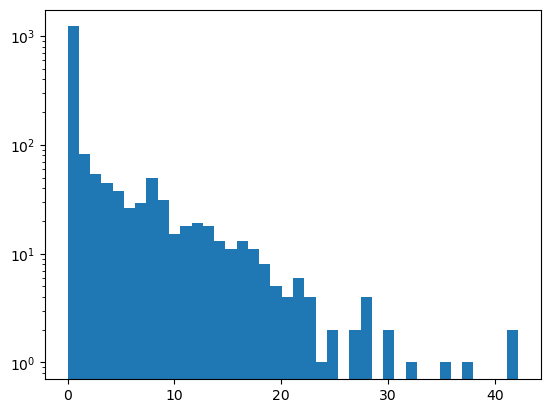

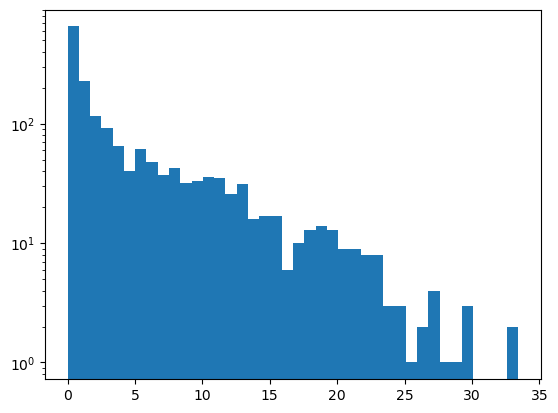

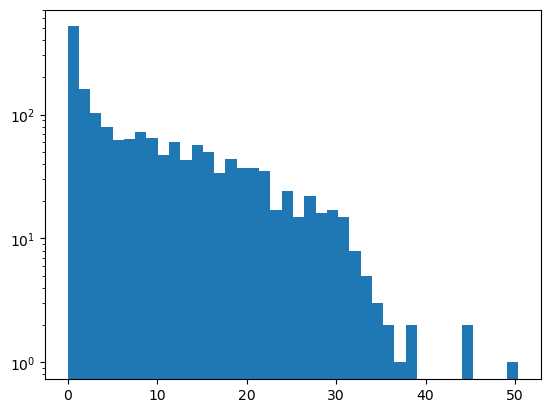

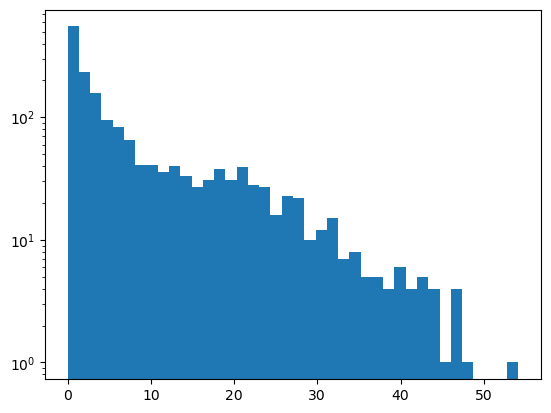

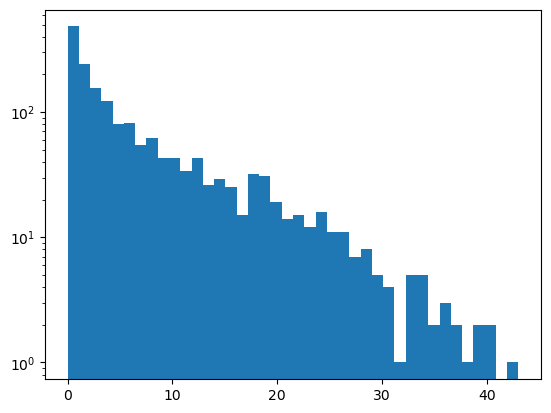

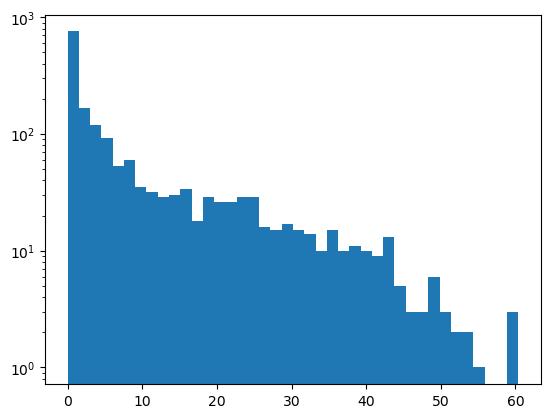

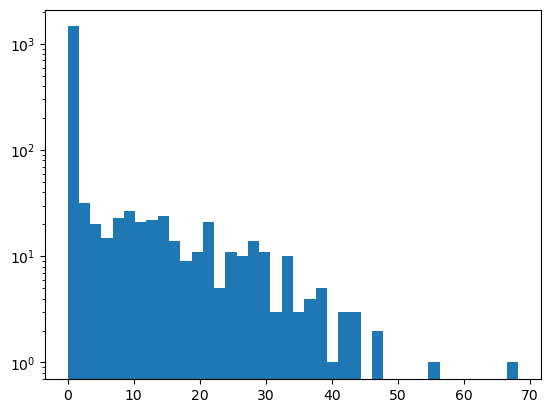

In [35]:
lildfs = {}
for i in range(len(dfs)):
    lildfs[names[i]] = build3Shist(dfs[i], 1)

Fitting 109 distributions:  28%|███████████████▎                                      | 31/109 [00:10<00:29,  2.61it/s]C:\Users\Lenovo\AppData\Local\Temp\ipykernel_41052\341521137.py:472: DeprecationWarning:         `gilbrat.fit` is deprecated, use `gibrat.fit` instead!
        `gilbrat` is a misspelling of the correct name for the `gibrat` distribution, and will be removed in SciPy 1.11.
  self.result = func(args, **kwargs)
Fitting 109 distributions:  31%|████████████████▊                                     | 34/109 [00:10<00:22,  3.31it/s]C:\Users\Lenovo\AppData\Local\Temp\ipykernel_41052\341521137.py:314: DeprecationWarning:         `gilbrat.pdf` is deprecated, use `gibrat.pdf` instead!
        `gilbrat` is a misspelling of the correct name for the `gibrat` distribution, and will be removed in SciPy 1.11.
  pdf_fitted = dist.pdf(self.x, *param)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_41052\341521137.py:323: DeprecationWarning:         `gilbrat.logpdf` is deprecated, use `gibra

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
johnsonsb,0.005009,984.999344,-6724.475516,inf,0.045571,0.175005
geninvgauss,0.005470,1017.841768,-6673.417321,inf,0.039420,0.320877
genhyperbolic,0.005803,1019.315536,-6632.872964,inf,0.035918,0.433822
betaprime,0.006302,1022.074571,-6591.442006,inf,0.040362,0.294216
bradford,0.006312,921.898838,-6596.897637,inf,0.096589,0.000037


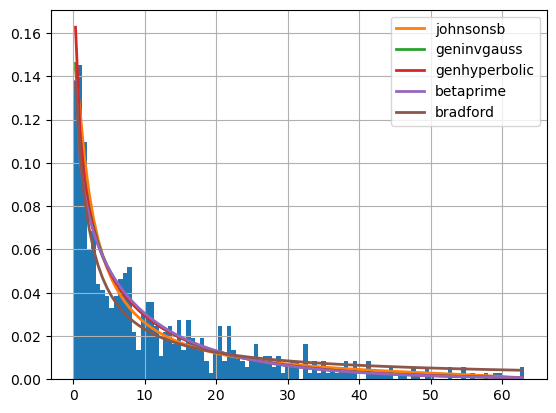

In [28]:
df = lildfs['tr3']
xynum = df['xy'].values
f = Fitter(xynum)
f.fit()
f.summary()

Fitting 9 distributions: 100%|███████████████████████████████████████████████████████████| 9/9 [00:31<00:00,  3.47s/it]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
geninvgauss,0.005470,1017.841768,-6673.417321,inf,0.039420,3.208770e-01
genhyperbolic,0.005803,1019.315536,-6632.872964,inf,0.035918,4.338221e-01
expon,0.013526,1029.932507,-6161.996665,inf,0.108459,2.189230e-06
uniform,0.062676,832.879972,-5274.174162,inf,0.485295,4.210126e-126
exponpow,inf,inf,inf,inf,NaN,NaN


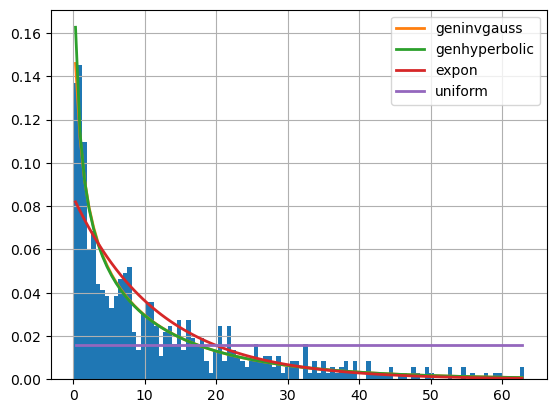

In [29]:
if True:
    df = lildfs['tr3']
    xynum = df['xy'].values
f = Fitter(xynum,
           distributions=['expon',
                          'exponpow',
                          "powerlaw",
                          'uniform',
                         'johnsonsb',
                         'geninvgauss',
                         'genhyperbolic',
                         'bradford',
                         'betaprime'])
f.fit()
f.summary()

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 109 distributions:  28%|███████

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
halfgennorm,0.195161,1889.164931,-4682.132241,inf,0.572402,1.532263e-182
lomax,0.269901,1378.330072,-4491.807362,inf,0.572402,1.532288e-182
gilbrat,0.317617,1700.820242,-4402.624316,inf,0.441027,1.713734e-104
gibrat,0.317617,1700.820242,-4402.624316,inf,0.441027,1.713734e-104
chi,0.371559,1334.582366,-4304.172346,inf,0.572400,1.537490e-182


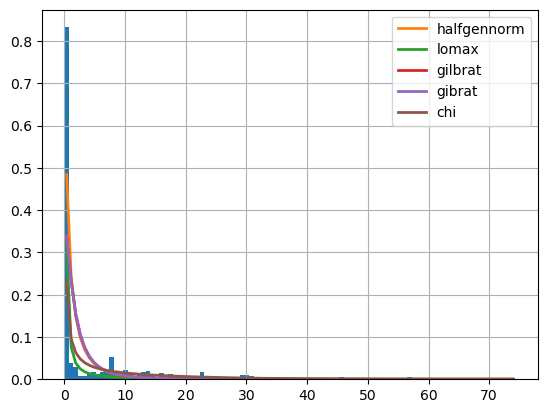

In [31]:
if True:
    df = lildfs['tr4']
    xynum = df['xy'].values
f = Fitter(xynum)
f.fit()
f.summary()

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 109 distributions:  29%|███████

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
levy,0.009174,1094.980070,-6435.003254,inf,0.210680,3.502464e-23
pareto,0.009701,1012.018349,-6396.088586,inf,0.098452,2.266791e-05
expon,0.009701,1010.018346,-6402.456770,inf,0.098452,2.266787e-05
lomax,0.010877,1121.306645,-6329.378139,inf,0.199667,7.576617e-21
halfcauchy,0.010881,1037.275450,-6335.522805,inf,0.116612,2.305629e-07


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


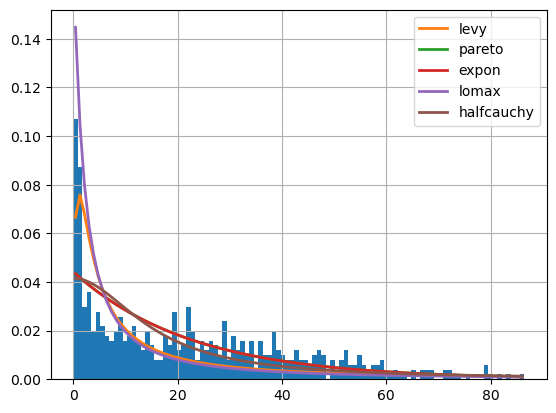

In [33]:
df = lildfs['tr5']
xynum = df['xy'].values
f = Fitter(xynum)
f.fit()
f.summary()

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 109 distributions:  28%|███████

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
levy,0.005345,1165.289231,-6775.122282,inf,0.183714,9.405119e-18
pareto,0.008695,1123.398728,-6484.119459,inf,0.109830,1.335395e-06
expon,0.008695,1121.398732,-6490.491038,inf,0.109830,1.335392e-06
moyal,0.015385,1162.041563,-6156.669071,inf,0.104677,4.913808e-06
kstwobign,0.016308,1194.859698,-6122.559376,inf,0.120093,8.258257e-08


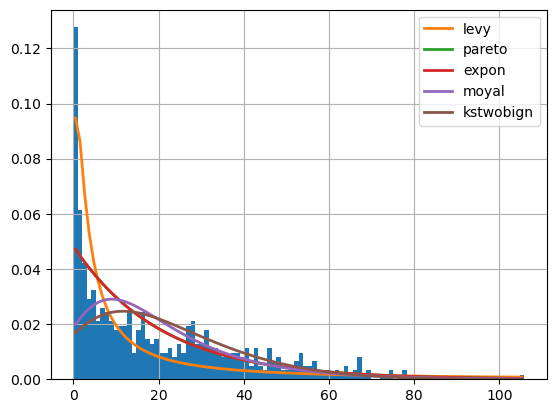

In [34]:
df = lildfs['tr6']
xynum = df['xy'].values
f = Fitter(xynum)
f.fit()
f.summary()

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 109 distributions:  28%|███████

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
pareto,0.015522,973.299757,-6133.574387,inf,0.102696,8.144079e-06
expon,0.015522,971.299753,-6139.944261,inf,0.102696,8.144056e-06
wald,0.020549,994.188762,-5976.079723,inf,0.093724,6.470886e-05
moyal,0.028408,994.513262,-5786.945601,inf,0.098742,2.078582e-05
gumbel_r,0.030553,996.727701,-5744.442993,inf,0.115695,2.882934e-07


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
C:\Users\Lenovo\anaconda3\envs\navigati

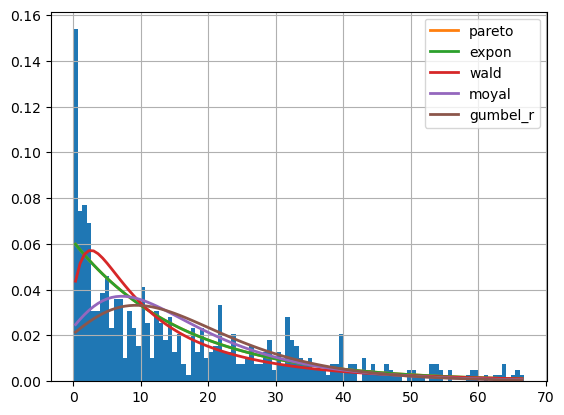

In [35]:
df = lildfs['tr7']
xynum = df['xy'].values
f = Fitter(xynum)
f.fit()
f.summary()

Fitting 109 distributions:  29%|███████████████▊                                      | 32/109 [02:01<05:45,  4.49s/it]C:\Users\Lenovo\AppData\Local\Temp\ipykernel_41052\341521137.py:472: DeprecationWarning:         `gilbrat.fit` is deprecated, use `gibrat.fit` instead!
        `gilbrat` is a misspelling of the correct name for the `gibrat` distribution, and will be removed in SciPy 1.11.
  self.result = func(args, **kwargs)
Fitting 109 distributions:  38%|████████████████████▎                                 | 41/109 [02:24<03:47,  3.34s/it]C:\Users\Lenovo\AppData\Local\Temp\ipykernel_41052\341521137.py:314: DeprecationWarning:         `gilbrat.pdf` is deprecated, use `gibrat.pdf` instead!
        `gilbrat` is a misspelling of the correct name for the `gibrat` distribution, and will be removed in SciPy 1.11.
  pdf_fitted = dist.pdf(self.x, *param)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_41052\341521137.py:323: DeprecationWarning:         `gilbrat.logpdf` is deprecated, use `gibra

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
lomax,0.017606,1164.574879,-6048.590819,inf,0.156778,5.553285e-13
invgamma,0.019765,1174.619118,-5981.160013,inf,0.165238,2.222637e-14
levy,0.020591,1171.239072,-5963.656550,inf,0.165488,2.015380e-14
pareto,0.035838,1111.085720,-5634.215846,inf,0.157830,3.756224e-13
expon,0.061233,1019.683144,-5328.279801,inf,0.221156,1.591794e-25


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


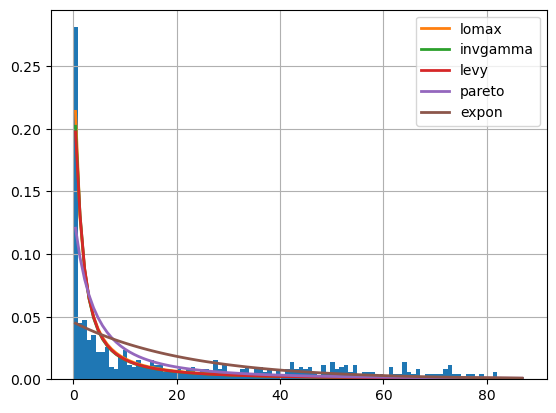

In [36]:
df = lildfs['tr91']
xynum = df['xy'].values
f = Fitter(xynum)
f.fit()
f.summary()

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,
Fitting 109 distributions:  28%|███████

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
cauchy,0.026438,1929.301445,-5883.955417,inf,0.294764,7.580309e-46
expon,0.658672,1448.921631,-3990.061249,inf,0.680707,3.148639e-271
pareto,0.658672,1450.921677,-3983.682807,inf,0.680707,3.150792e-271
laplace,0.713232,1591.902097,-3943.188053,inf,0.484112,1.313341e-127
gumbel_r,0.746241,1475.567001,-3916.540137,inf,0.434621,1.098565e-101


C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


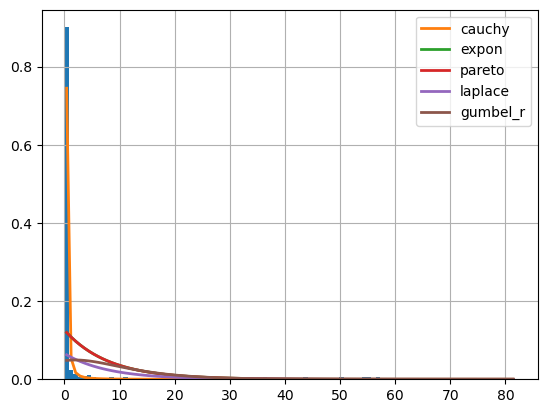

In [38]:
df = lildfs['tr92']
xynum = df['xy'].values
f = Fitter(xynum)
f.fit()
f.summary()

### only exponential / power law

In [12]:
get_common_distributions()

['cauchy',
 'chi2',
 'expon',
 'exponpow',
 'gamma',
 'lognorm',
 'norm',
 'powerlaw',
 'rayleigh',
 'uniform']

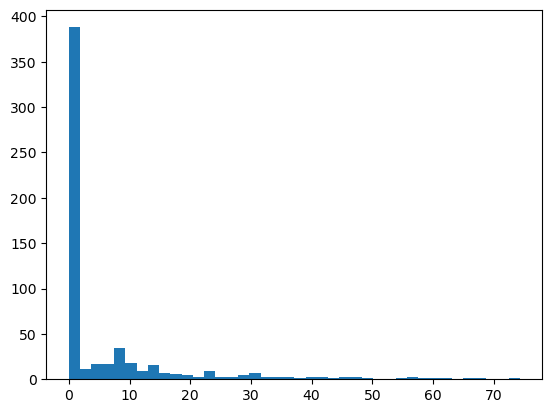

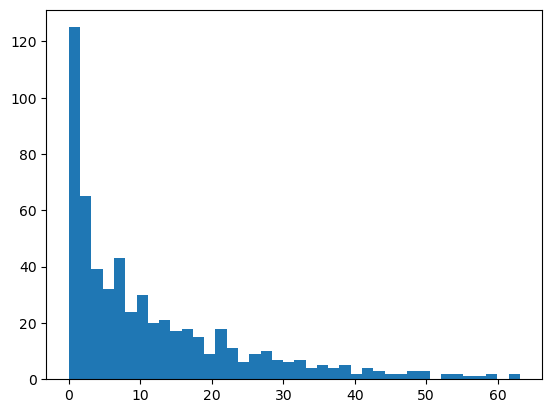

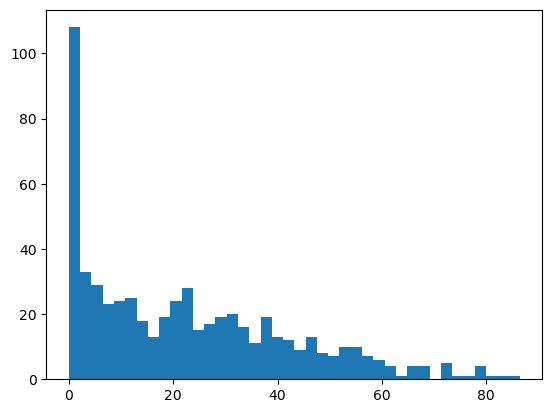

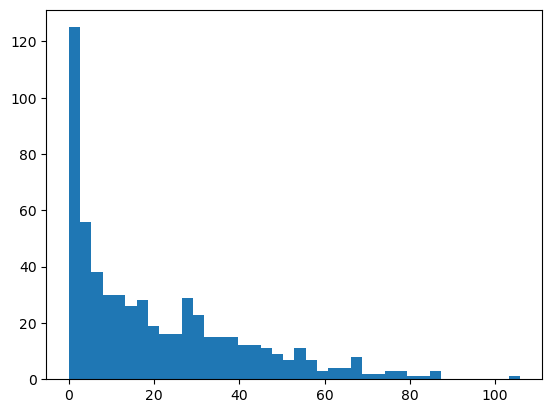

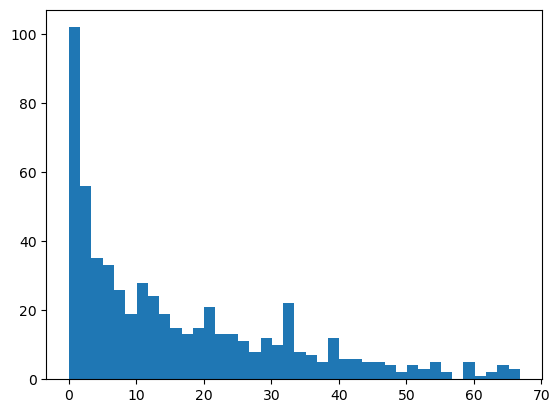

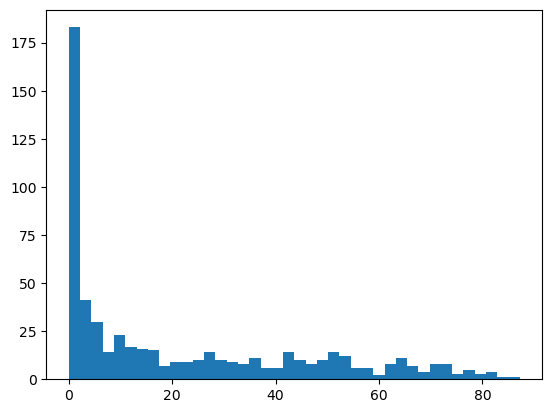

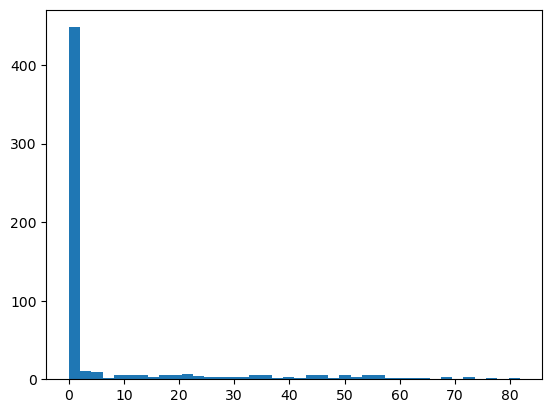

In [13]:
lildfs = {}
for i in range(len(dfs)):
    lildfs[names[i]] = build3Shist(dfs[i], 3)

Fitting 2 distributions: 100%|███████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.90it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
powerlaw,0.004452,940.890463,-6850.110128,inf,0.125849,1.655504e-08
expon,0.009701,1010.018346,-6402.456770,inf,0.098452,2.266787e-05


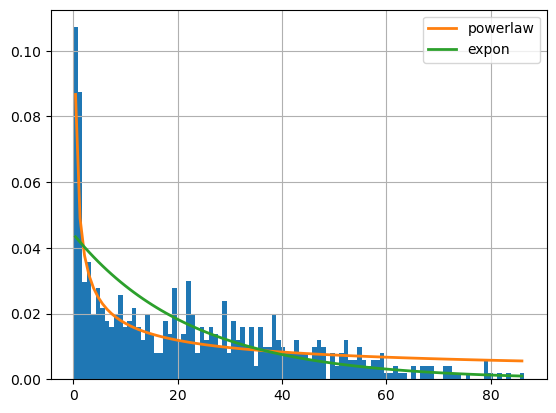

In [14]:
df = lildfs['tr5']
xynum = df['xy'].values
f = Fitter(xynum, distributions=['powerlaw','expon'])
f.fit()
f.summary()

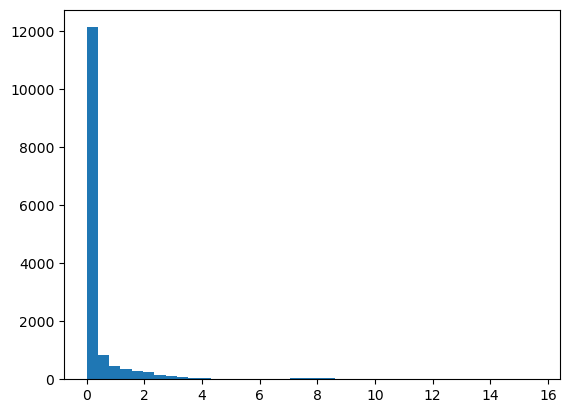

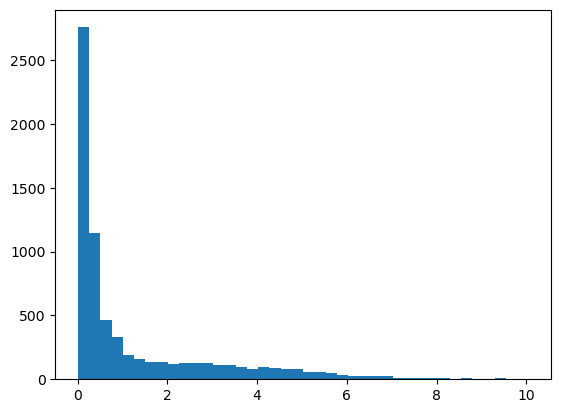

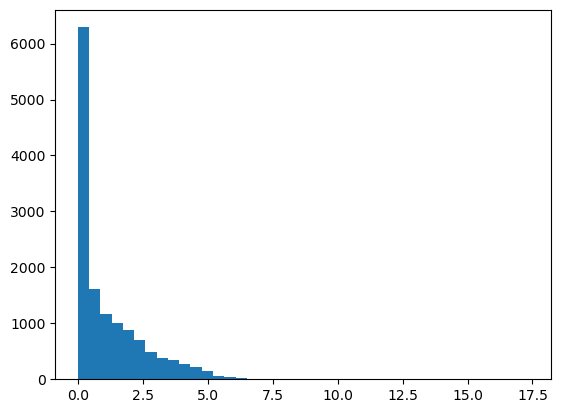

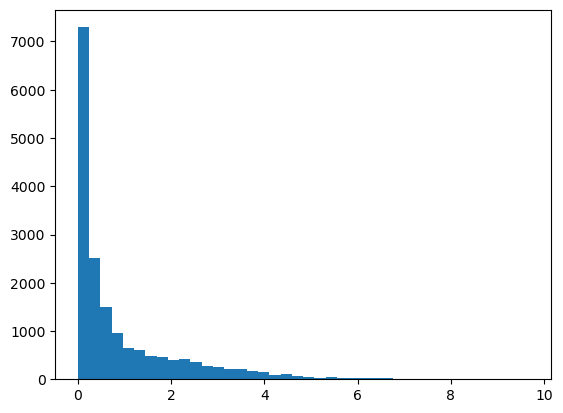

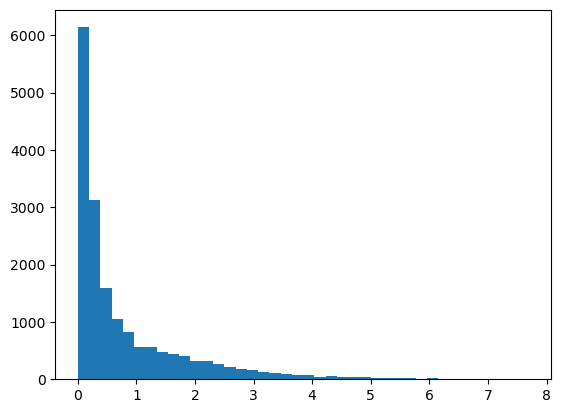

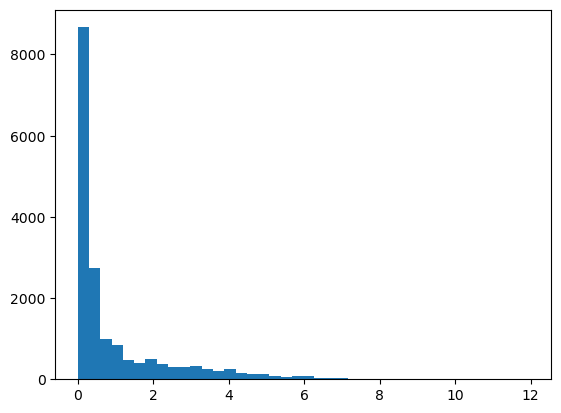

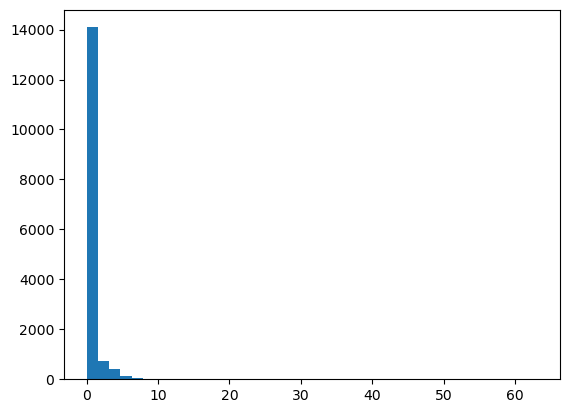

In [15]:
lildfs = {}
for i in range(len(dfs)):
    lildfs[names[i]] = build3Shist(dfs[i], 0.1)

Fitting 2 distributions: 100%|███████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  4.72it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
expon,1.350554,1514.577437,-126205.109548,inf,0.211818,0.0
powerlaw,2.206481,632.784692,-119477.834198,inf,0.439248,0.0


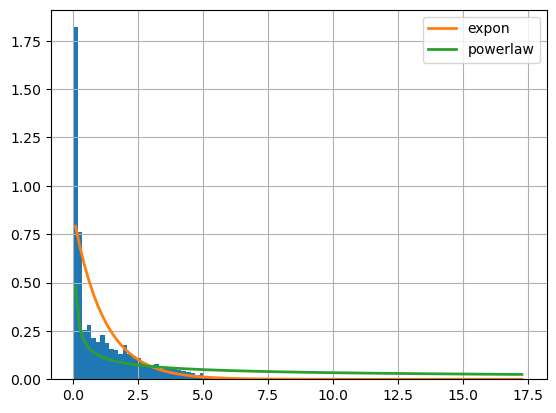

In [16]:
df = lildfs['tr5']
xynum = df['xy'].values
f = Fitter(xynum, distributions=['powerlaw','expon'])
f.fit()
f.summary()

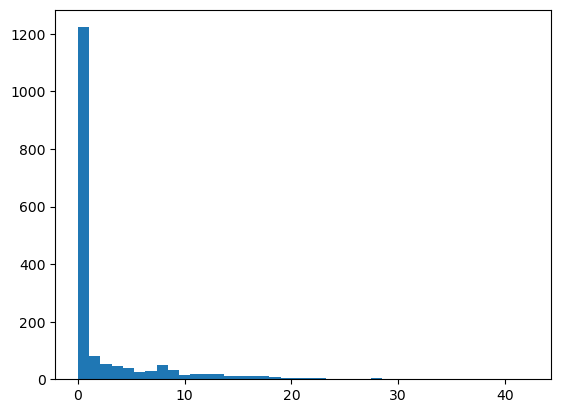

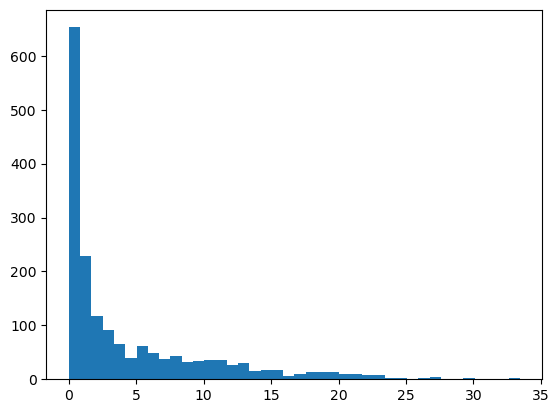

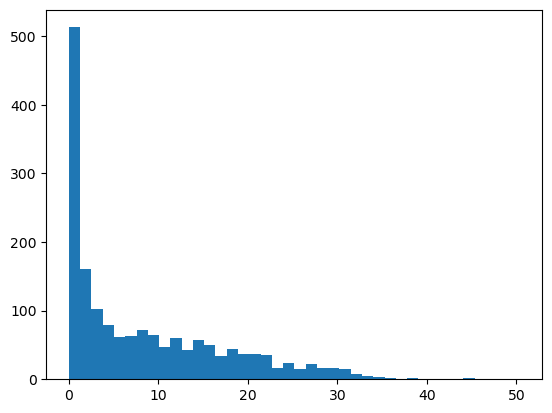

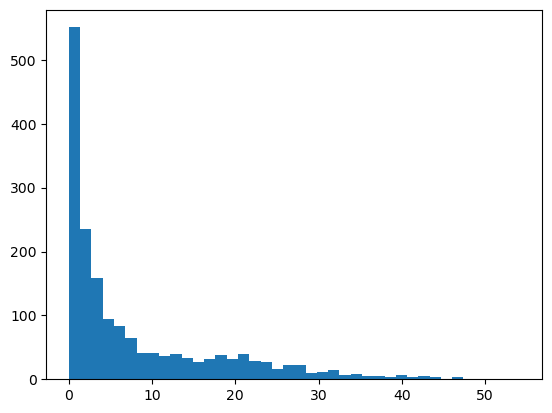

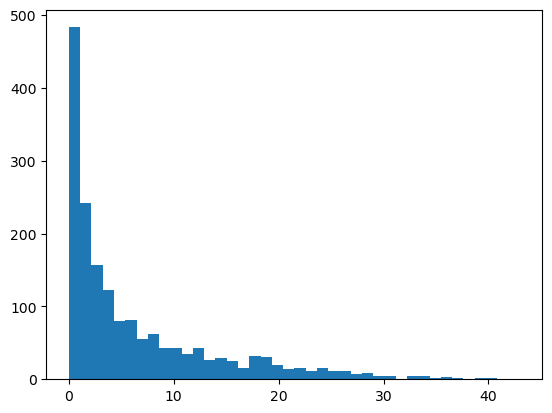

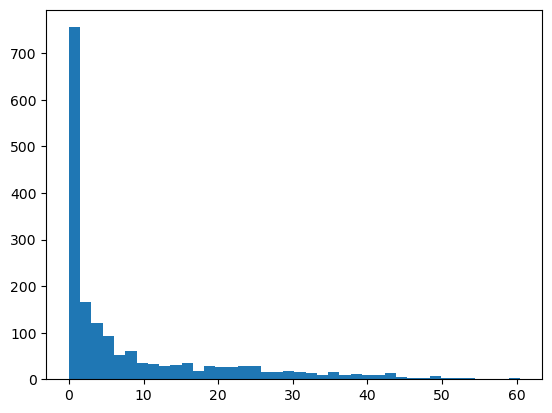

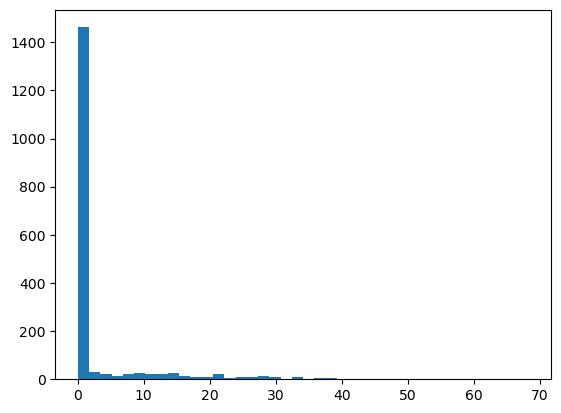

In [17]:
lildfs = {}
for i in range(len(dfs)):
    lildfs[names[i]] = build3Shist(dfs[i], 1)

Fitting 2 distributions: 100%|███████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.38it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
powerlaw,0.033220,873.320616,-18541.064734,inf,0.163741,1.486379e-40
expon,0.080565,1026.587545,-17032.706322,inf,0.164997,3.554464e-41


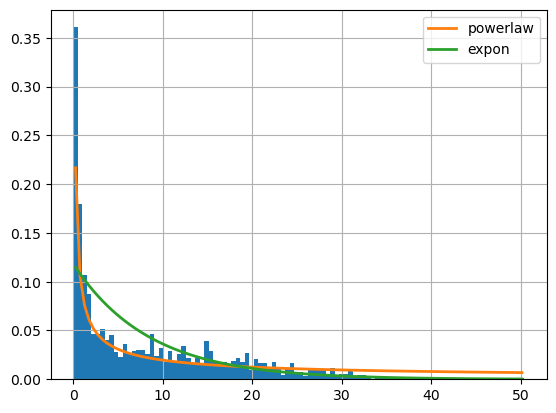

In [18]:
df = lildfs['tr5']
xynum = df['xy'].values
f = Fitter(xynum, distributions=['powerlaw','expon'])
f.fit()
f.summary()

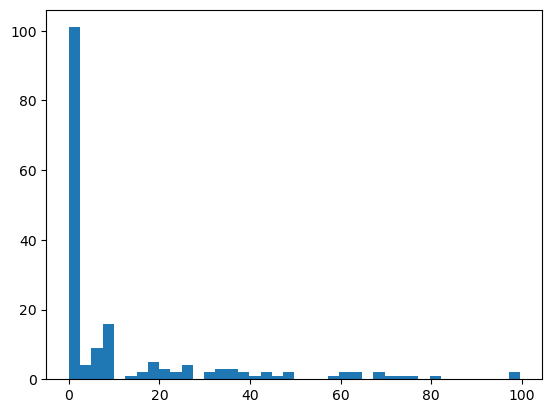

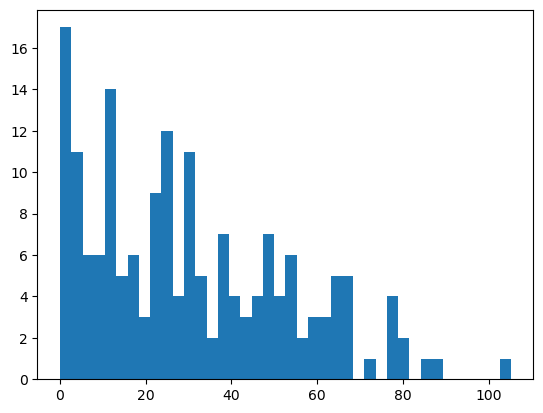

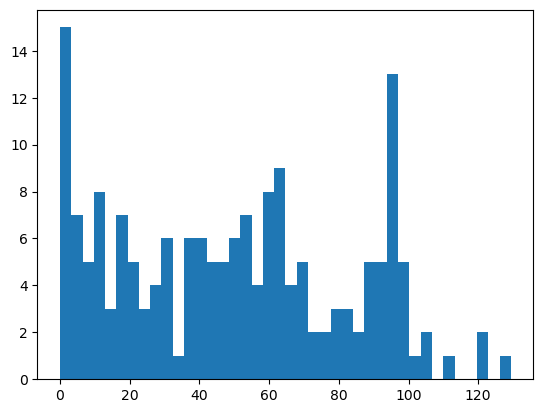

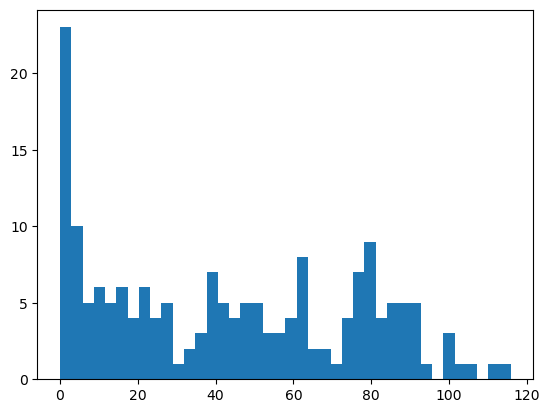

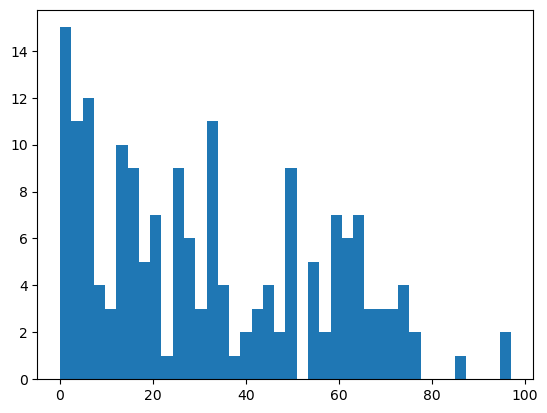

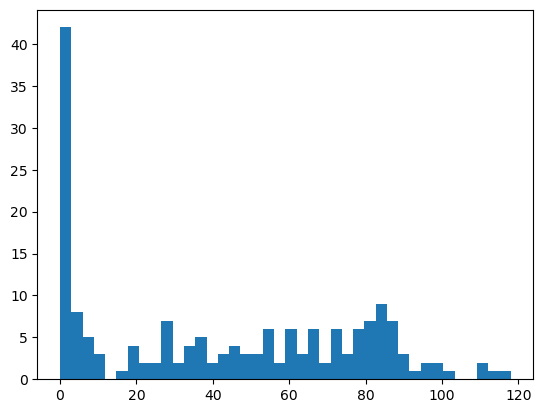

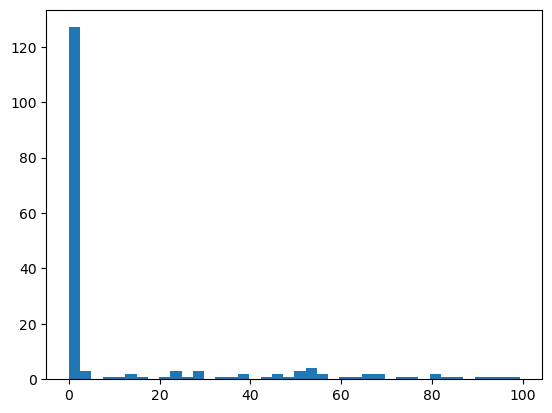

In [19]:
lildfs = {}
for i in range(len(dfs)):
    lildfs[names[i]] = build3Shist(dfs[i], 10)

Fitting 2 distributions: 100%|███████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.46it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
powerlaw,0.003910,993.577443,-1870.253696,inf,0.123526,0.008462
expon,0.005014,1045.653155,-1831.676353,inf,0.152658,0.000478


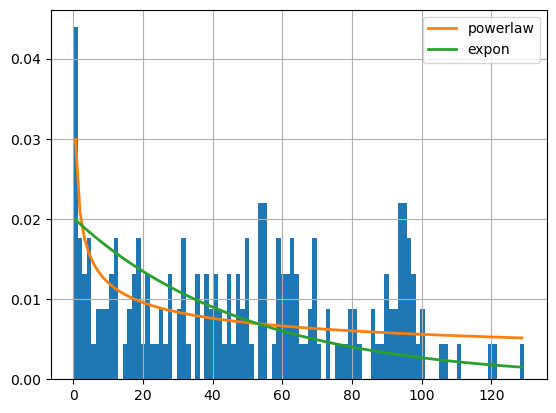

In [20]:
df = lildfs['tr5']
xynum = df['xy'].values
f = Fitter(xynum, distributions=['powerlaw','expon'])
f.fit()
f.summary()

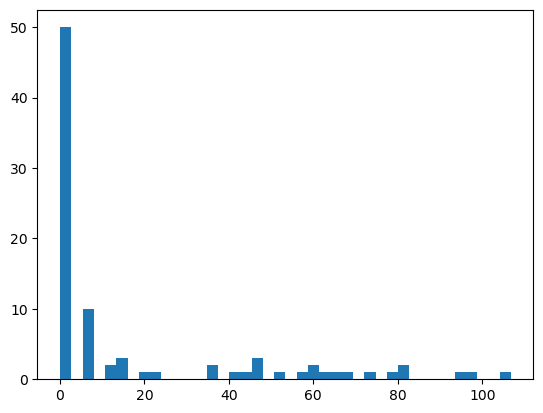

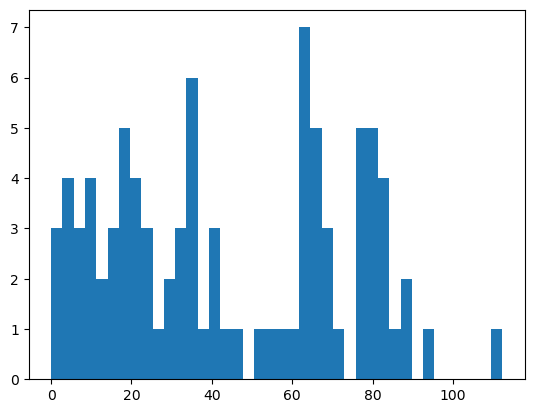

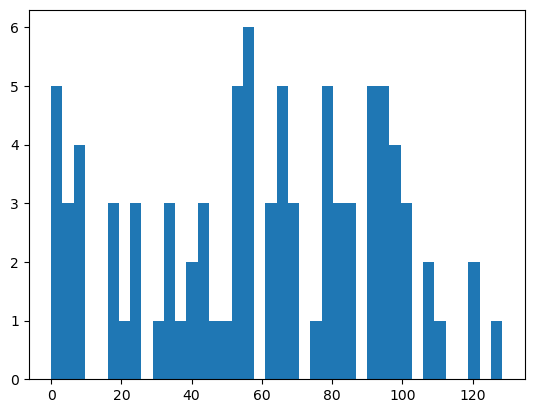

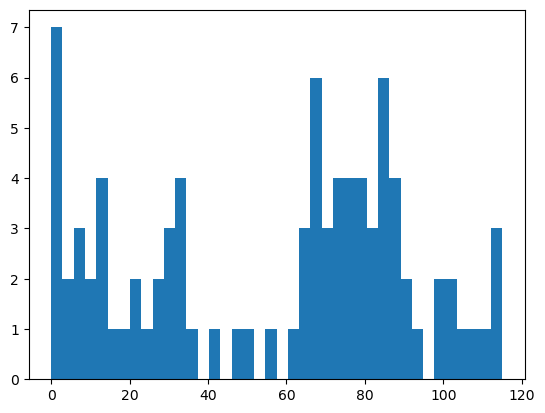

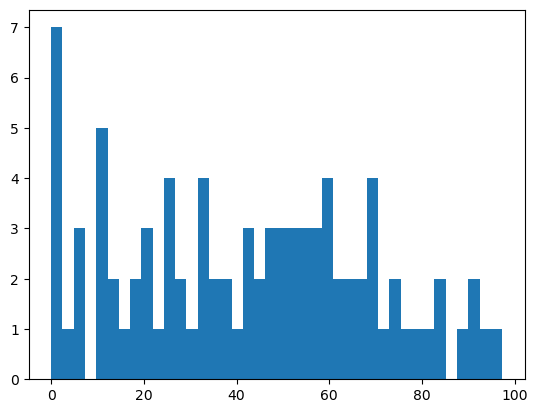

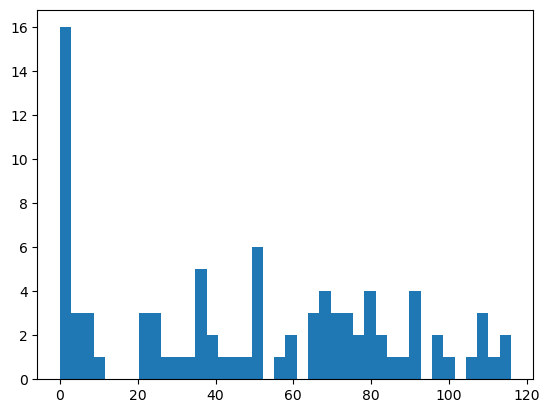

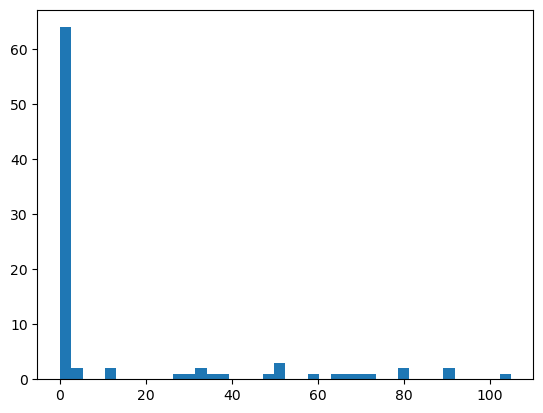

In [21]:
lildfs = {}
for i in range(len(dfs)):
    lildfs[names[i]] = build3Shist(dfs[i], 20)

Fitting 2 distributions: 100%|███████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 24.65it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
powerlaw,0.008306,988.785416,-802.157266,inf,0.162460,0.016961
expon,0.009306,1036.814496,-796.631912,inf,0.235591,0.000088


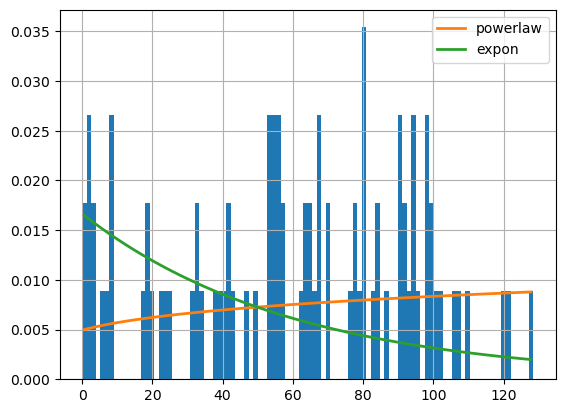

In [22]:
df = lildfs['tr5']
xynum = df['xy'].values
f = Fitter(xynum, distributions=['powerlaw','expon'])
f.fit()
f.summary()

### распределения скоростей

In [22]:
def addFilteredV(df):
    ind = range(0, len(df))
    df = df.reindex(ind)
    vx = []
    vy = []
    v = []
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            v.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vv = pow(pow(vvx, 2) + pow(vvy, 2), 0.5)
            vx.append(vvx)
            vy.append(vvy)
            v.append(vv)
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "V", v)
    df['V'] = pd.Series(gaussian_filter1d(df['V'], 5))
    df['Vx'] = pd.Series(gaussian_filter1d(df['Vx'], 5))
    df['Vx'] = pd.Series(gaussian_filter1d(df['Vy'], 5))
    return(df)

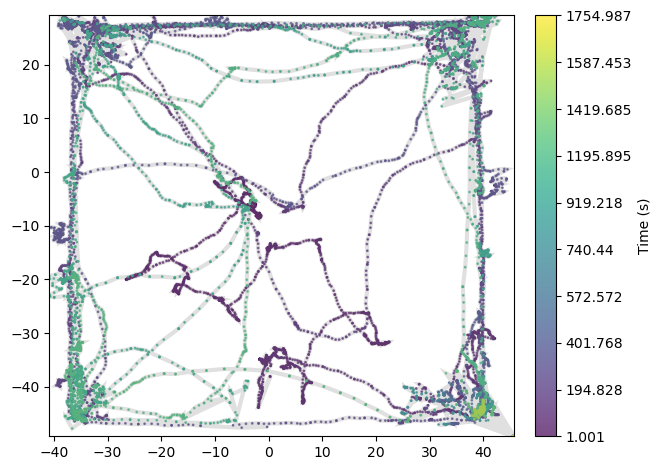

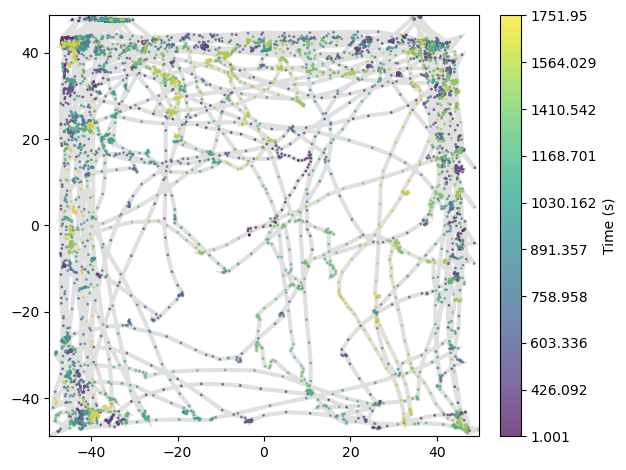

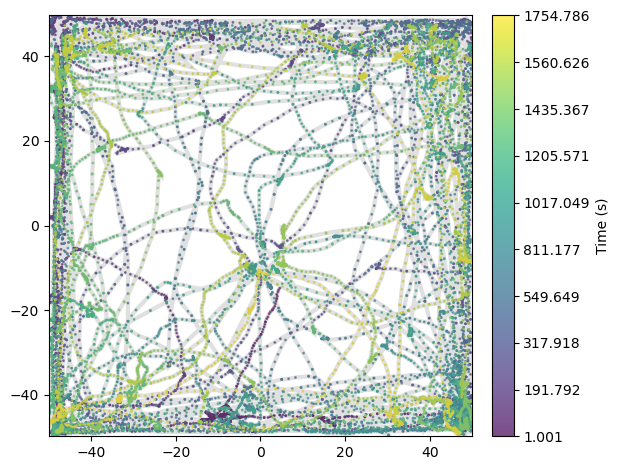

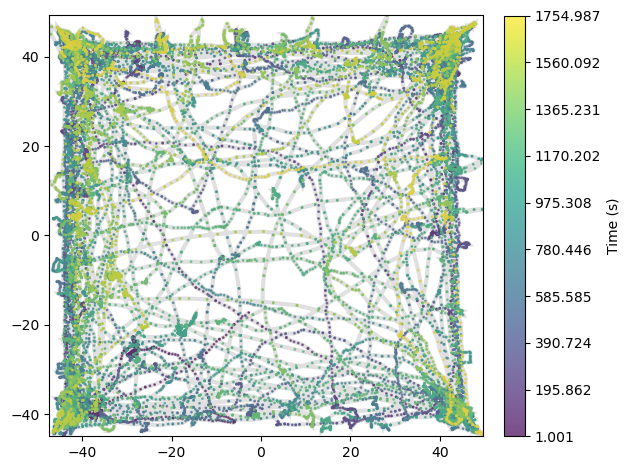

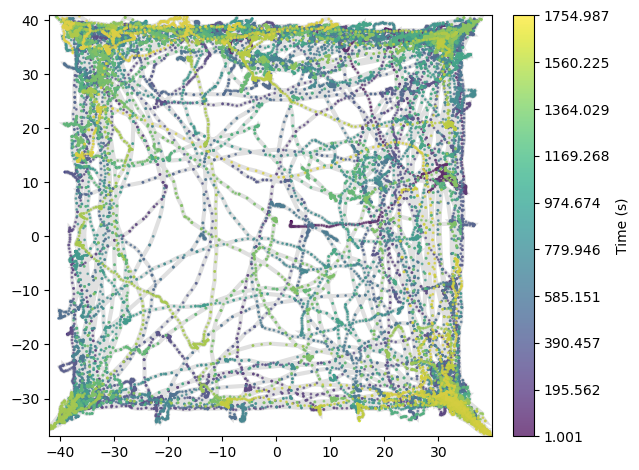

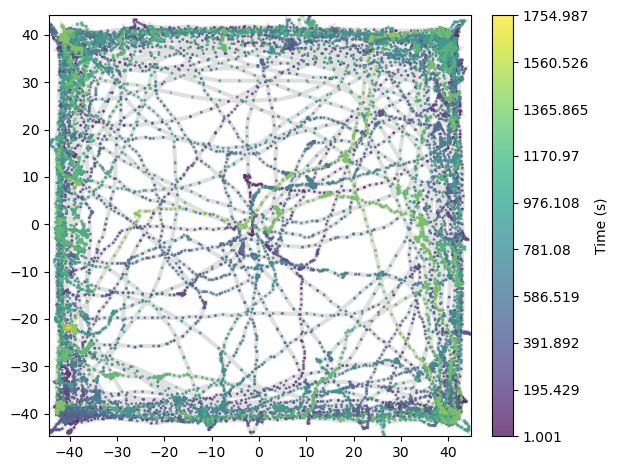

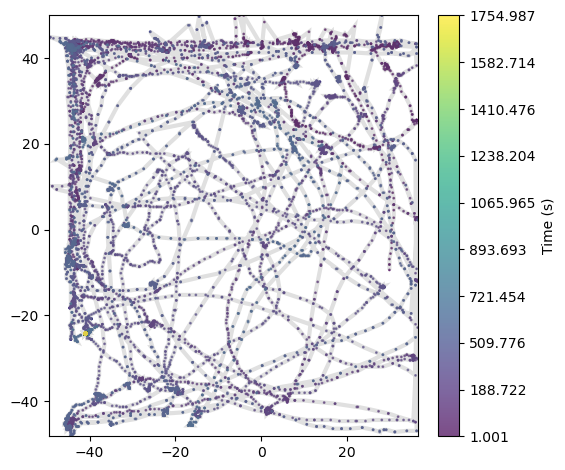

In [32]:
tr4, tr3, tr5, tr6, tr7 = openFile('Trace_4.txt'), openFile('Trace_3.txt'), openFile('Trace_5.txt'), openFile('Trace_6.txt'), openFile('Trace_7.txt')
tr91, tr92 = openFile('Trace_9.1.txt'), openFile('Trace_9.2.txt') 
dfs = [tr4, tr3, tr5, tr6, tr7, tr91, tr92]
names = ['tr4','tr3','tr5','tr6','tr7', 'tr91','tr92']

In [17]:
names

['tr4', 'tr3', 'tr5', 'tr6', 'tr7', 'tr91', 'tr92']

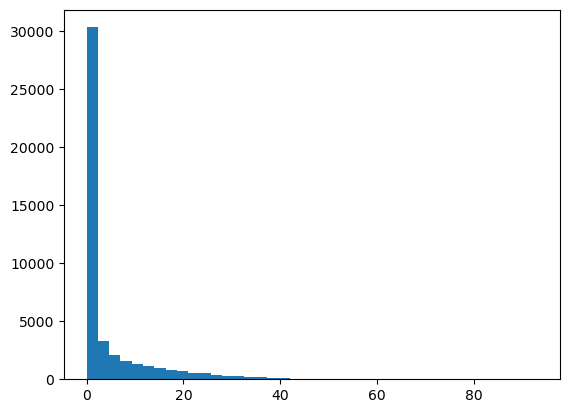

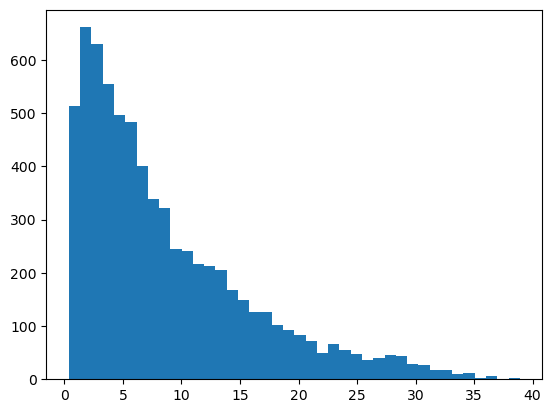

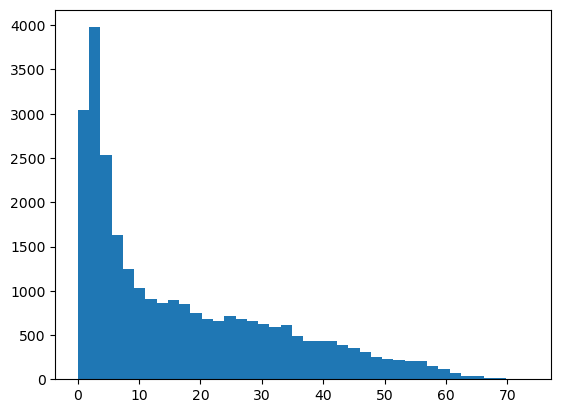

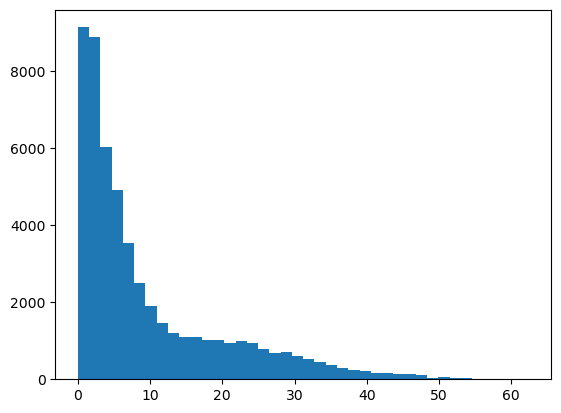

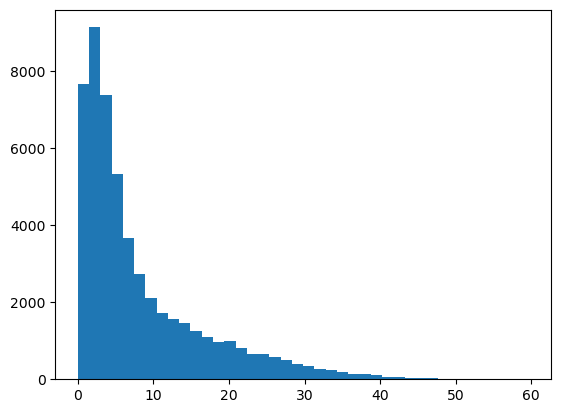

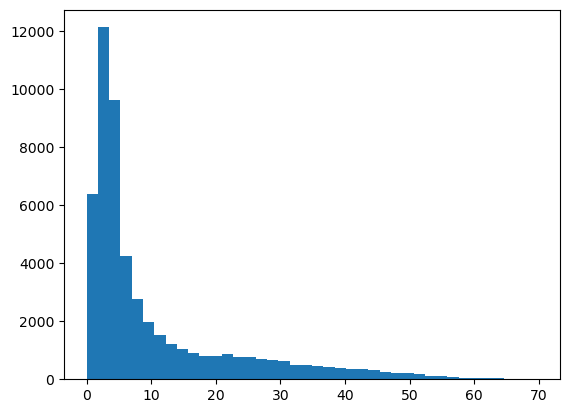

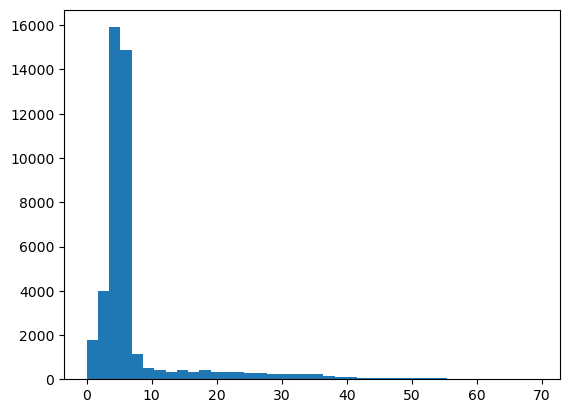

In [33]:
for i in range(len(dfs)):
    dfs[i] = addFilteredV(dfs[i])
    v = dfs[i]["V"].to_numpy()
    #histogram
    plt.figure()
    plt.hist(v, bins=40)
    plt.show()

Fitting 109 distributions:  29%|███████████████▊                                      | 32/109 [00:45<03:07,  2.44s/it]C:\Users\Lenovo\AppData\Local\Temp\ipykernel_50208\341521137.py:472: DeprecationWarning:         `gilbrat.fit` is deprecated, use `gibrat.fit` instead!
        `gilbrat` is a misspelling of the correct name for the `gibrat` distribution, and will be removed in SciPy 1.11.
  self.result = func(args, **kwargs)
Fitting 109 distributions:  84%|█████████████████████████████████████████████▌        | 92/109 [03:30<00:49,  2.92s/it]C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
fatiguelife,0.000667,1108.874366,-954167.676435,inf,0.024384,1.527456e-27
invgauss,0.000975,1103.421561,-934246.907717,inf,0.036030,1.238168e-59
fisk,0.002084,1097.114223,-894402.488728,inf,0.036637,1.202407e-61
invgamma,0.002545,1104.697534,-883922.092352,inf,0.045163,1.816128e-93
burr,0.002753,1103.307526,-879782.616483,inf,0.038066,1.631722e-66


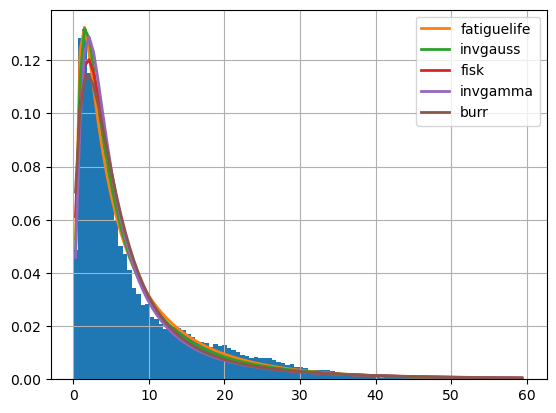

In [36]:
df = dfs[4]
v = df['V'].values
f = Fitter(v)
f.fit()
f.summary()

Fitting 109 distributions:  25%|█████████████▍                                        | 27/109 [02:00<07:04,  5.18s/it]C:\Users\Lenovo\AppData\Local\Temp\ipykernel_50208\341521137.py:472: DeprecationWarning:         `gilbrat.fit` is deprecated, use `gibrat.fit` instead!
        `gilbrat` is a misspelling of the correct name for the `gibrat` distribution, and will be removed in SciPy 1.11.
  self.result = func(args, **kwargs)
Fitting 109 distributions:  91%|█████████████████████████████████████████████████     | 99/109 [05:36<00:17,  1.80s/it]C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
expon,0.251721,2343.095672,-546677.056939,inf,0.567405,0.0
pareto,0.251721,2345.095678,-546666.336994,inf,0.567405,0.0
laplace,0.317872,2481.725108,-536133.213567,inf,0.500000,0.0
gumbel_r,0.342817,2505.562598,-532719.304962,inf,0.330055,0.0
hypsecant,0.354336,2524.958665,-531225.843868,inf,0.359313,0.0


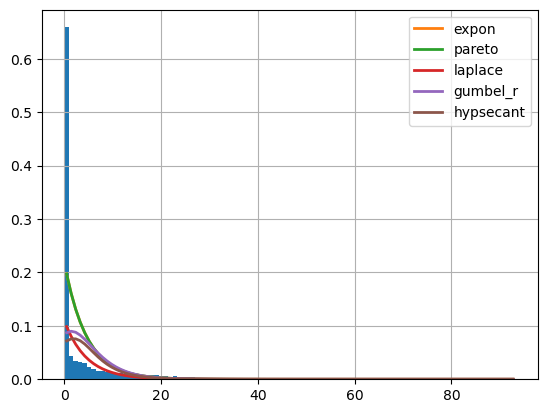

In [38]:
df = dfs[0]
v = df['V'].values
f = Fitter(v)
f.fit()
f.summary()

Fitting 109 distributions:  27%|██████████████▎                                       | 29/109 [02:02<06:18,  4.73s/it]C:\Users\Lenovo\AppData\Local\Temp\ipykernel_50208\341521137.py:472: DeprecationWarning:         `gilbrat.fit` is deprecated, use `gibrat.fit` instead!
        `gilbrat` is a misspelling of the correct name for the `gibrat` distribution, and will be removed in SciPy 1.11.
  self.result = func(args, **kwargs)
Fitting 109 distributions:  90%|████████████████████████████████████████████████▌     | 98/109 [05:35<00:26,  2.41s/it]C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\scipy\integrate\_quadpack_py.py:1151: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
expon,0.005113,889.944575,-98072.515995,inf,0.041821,5.408857e-11
pareto,0.005113,891.944574,-98063.669692,inf,0.041821,5.408851e-11
moyal,0.012780,946.158748,-91709.547768,inf,0.060068,3.149804e-22
gumbel_r,0.018361,967.588133,-89192.738669,inf,0.075755,4.096110e-35
cauchy,0.026024,984.303583,-86770.234545,inf,0.185736,3.130181e-210


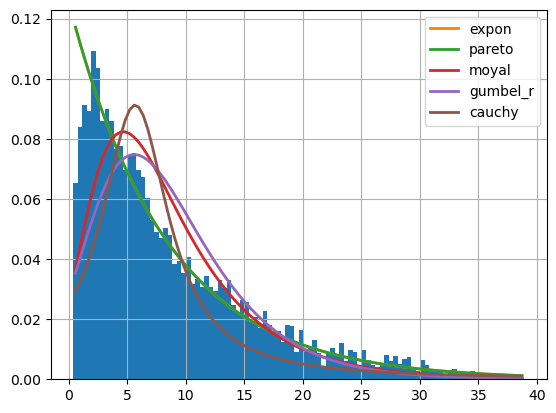

In [39]:
df = dfs[1]
v = df['V'].values
f = Fitter(v)
f.fit()
f.summary()